<a href="https://colab.research.google.com/github/brad0taylor/Graph/blob/master/alu_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#ALU Demo
* NN is used to emulate classic ALU with Add/Sub, Bitwise, Trig functions
* Setup for values between -100 and +100


## Import Modules

In [2]:
from __future__ import print_function
import keras.backend as K 
import keras
from keras.datasets import cifar10
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Lambda
from keras.layers import Conv2D, MaxPooling2D
from keras.utils  import to_categorical
from keras import regularizers
from keras.layers import RNN, dot
from keras import optimizers



import os

import numpy as np
import math

import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Using TensorFlow backend.


Found GPU at: /device:GPU:0


In [0]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import  sys
def printf(format, *args):
#    print(format % args )
    sys.stdout.write(format % args)
    
#printf('x0=%f3', x[0,0] )

##Utility Functions

In [4]:
def bit_count(n):
      assert n >= 0, 'Argument of bit_count() must be non-negative'
      count = 0
      while n:
          n &= n - 1
          count += 1
      return count
  

for i in range(100) :
  ii=int(i)
  bits= bit_count(i)
  print(bin(ii),bits)
  

0b0 0
0b1 1
0b10 1
0b11 2
0b100 1
0b101 2
0b110 2
0b111 3
0b1000 1
0b1001 2
0b1010 2
0b1011 3
0b1100 2
0b1101 3
0b1110 3
0b1111 4
0b10000 1
0b10001 2
0b10010 2
0b10011 3
0b10100 2
0b10101 3
0b10110 3
0b10111 4
0b11000 2
0b11001 3
0b11010 3
0b11011 4
0b11100 3
0b11101 4
0b11110 4
0b11111 5
0b100000 1
0b100001 2
0b100010 2
0b100011 3
0b100100 2
0b100101 3
0b100110 3
0b100111 4
0b101000 2
0b101001 3
0b101010 3
0b101011 4
0b101100 3
0b101101 4
0b101110 4
0b101111 5
0b110000 2
0b110001 3
0b110010 3
0b110011 4
0b110100 3
0b110101 4
0b110110 4
0b110111 5
0b111000 3
0b111001 4
0b111010 4
0b111011 5
0b111100 4
0b111101 5
0b111110 5
0b111111 6
0b1000000 1
0b1000001 2
0b1000010 2
0b1000011 3
0b1000100 2
0b1000101 3
0b1000110 3
0b1000111 4
0b1001000 2
0b1001001 3
0b1001010 3
0b1001011 4
0b1001100 3
0b1001101 4
0b1001110 4
0b1001111 5
0b1010000 2
0b1010001 3
0b1010010 3
0b1010011 4
0b1010100 3
0b1010101 4
0b1010110 4
0b1010111 5
0b1011000 3
0b1011001 4
0b1011010 4
0b1011011 5
0b1011100 4
0b1011101 

In [0]:
#err=4.0 #alu0 - 2 layer dense x100
#err=0.5 #alu1 - 4 layer dense x100
#alu2 - 2 layer dense x200
#alu3 - 2 layer dense x200
#alu4 - 4 layer dense x200,  mult layer


##Create 26 opcodes by initialization patterns

(26000, 1, 28) (26000, 1)


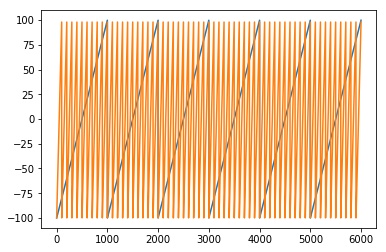

opcodes= 26 ['cst0' 'sign' 'sela' 'selb' 'add' 'sub' 'mult' 'div' 'mod' 'max' 'min'
 'abs' 'log' 'exp' 'sin' 'cos' 'tanh' 'xor' 'shft' 'and' 'or' 'popc'
 'inta' 'intb' 'bit0' 'bitx']
[ 999,0] op=cst0 opA=99.80 opB=98.00 out=   +0.00  ---- A= 63cc B= 6200 O=    0 --- a=       0b1100011 b=       0b1100010 o=                             0b0 
[1999,0] op=sign opA=99.80 opB=98.00 out= +100.00  ---- A= 63cc B= 6200 O= 6400 --- a=       0b1100011 b=       0b1100010 o=                       0b1100100 
[2999,0] op=sela opA=99.80 opB=98.00 out=  +99.80  ---- A= 63cc B= 6200 O= 63cc --- a=       0b1100011 b=       0b1100010 o=                       0b1100011 
[3999,0] op=selb opA=99.80 opB=98.00 out=  +98.00  ---- A= 63cc B= 6200 O= 6200 --- a=       0b1100011 b=       0b1100010 o=                       0b1100010 
[4999,0] op= add opA=99.80 opB=98.00 out= +197.80  ---- A= 63cc B= 6200 O= c5cc --- a=       0b1100011 b=       0b1100010 o=                      0b11000101 
[5999,0] op= sub opA=99.80 

In [5]:
#make the ops
#x=np.vstack((np.random.rand(1000,10),-np.random.rand(1000,10)))
#y=np.vstack((np.ones((1000,1)),np.zeros((1000,1))))

scale = 200
offset = 100

nsamp=26000
x=np.random.random((nsamp,1,28))
y=np.zeros((nsamp,1))



op = np.zeros(nsamp,int)
op  = op.astype(str)
opcodes  = np.zeros(26)
opcodes  = op.astype(str)
opcode=0

# initialize initial data
for i in range(int(nsamp/1000)) :
  for j in range (10) :
    for k in range(100) :
      x[i*1000+j*100+k,0,0]=(j/10+k/1000 )*scale-offset
      x[i*1000+j*100+k,0,1]=(k*1/100     )*scale-offset
  
print(x.shape, y.shape)
plt.plot(x [20000:26000,0,0:2],'-')
#plt.plot(y [0:nsamp], '-')
#plt.plot(yo[0:nsamp], '-')
plt.show()

  


def bit_count(n):
#   assert n >= 0, 'Argument of bit_count() must be non-negative'
    count = 0
    while n:
        n &= n - 1
        count += 1
    return count
  
i=0;

if(1) :
  # cst0
  n=1000 
  x[ i:i+n,:,2:28] =  to_categorical(opcode, 26)
  y[ i:i+n,:     ] = 0
  op[i:i+n]='cst0'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  # sign 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.sign(x[i:i+n,:,0]  )*100
  op[i:i+n]='sign'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  


if(1) :
  # sela
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = x[ i:i+n,:,0]
  op[i:i+n]='sela'
  opcodes[opcode]=op[i]
  i=i+n; opcode=opcode+1
  
  #selb 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = x[ i:i+n,:,1]
  op[i:i+n]='selb'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

if(1) :

  # add 
  n=1000 
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = x[i:i+n,:,0] + x[i:i+n,:,1] 
  op[i:i+n]='add'
  opcodes[opcode]=op[i]
  i=i+n; opcode=opcode+1
  
if(1)  :
  # sub 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = x[i:i+n,:,0] - x[i:i+n,:,1] 
  op[i:i+n]='sub'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

if(1) :
  # mult 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = x[i:i+n,:,0] * x[i:i+n,:,1] / 100
  op[i:i+n]='mult'
  opcodes[opcode]=op[i]
  i=i+n; opcode=opcode+1

if(1) :  
  # div 
  n=1000 
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    if x[i+j,:,1]!=0 :
      y[ i+j,0     ] = x[i+j,0,0] / x[i+j,0,1]
    else :
      y[ i+j,0     ] = 0
  op[i:i+n]='div'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  # mod 
  n=1000 
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    if x[i+j,:,1]!=0 :
      y[ i+j,0     ] = x[i+j,0,0] % x[i+j,0,1]
    else :
      y[ i+j,0     ] = 0
  op[i:i+n]='mod'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

if (1) :
  # max 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.maximum( x[i:i+n,:,0] ,  x[i:i+n,:,1] )
  op[i:i+n]='max'
  opcodes[opcode]=op[i]
  i=i+n; opcode=opcode+1
  
  # min 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.minimum(x[i:i+n,:,0] ,  x[i:i+n,:,1] )
  op[i:i+n]='min'
  opcodes[opcode]=op[i]
  i=i+n; opcode=opcode+1
  
  
  # abs 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.abs(x[i:i+n,:,0]  )
  op[i:i+n]='abs'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

if(1):
  # log 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    if x[i+j,0,0]>0 :
      y[ i+j,0     ] = min(200,np.log(x[i+j,0,0] )*50)
    else :
      y[ i+j,0     ] = 0
  

  op[i:i+n]='log'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  # e^x 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ]= min(200,np.exp(x[i+j,0,0]/100 )*50 )
  op[i:i+n]='exp'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  # sin 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.sin(x[i:i+n,:,0]/scale*3.14*4 )*100
  op[i:i+n]='sin'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  # cos 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.cos(x[i:i+n,:,0]/scale*3.14*4 )*100
  op[i:i+n]='cos'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  # tanh 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  y[ i:i+n,:     ] = np.tanh(x[i:i+n,:,0]/scale*3.14*4)*100
  op[i:i+n]='tanh'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

if(1) :
   # xor
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,0]) ^ np.int(x[i+j,:,1])  )
  op[i:i+n]='xor'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  # shift 
  n=1000 
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,0]) << max(0,min(4,np.int(x[i+j,:,1]/25) )) )
  op[i:i+n]='shft'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  # and
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,0]) & np.int(x[i+j,:,1])  )
  op[i:i+n]='and'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  
  # or
  n=1000
  x[ i:i+n,:,2:28] =to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,0]) | np.int(x[i+j,:,1])  )
  op[i:i+n]='or'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1
  
  
   
  
  
  # bitcount
  
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = bit_count(max(0,np.int(x[i+j,:,0]))) * 8
  op[i:i+n]='popc'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  # inta 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,0])) 
  op[i:i+n]='inta'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  # intb 
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    y[ i+j,0     ] = (np.int(x[i+j,:,1])) 
  op[i:i+n]='intb'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

  
  # bit 0
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    
    y[ i+j,0     ] = ((np.int(x[i+j,:,0])) & 1)*100
  op[i:i+n]='bit0'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1

   # bit extract
  n=1000
  x[ i:i+n,:,2:28] = to_categorical(opcode, 26)
  for j in range(n):
    
    y[ i+j,0     ] = ((np.int(x[i+j,:,0]))>>max(0,min(16,np.int(x[i+j,:,1]/25))) & 1)*100
  op[i:i+n]='bitx'
  opcodes[opcode]=op[i]
  i=i+n;  opcode=opcode+1


print("opcodes=", opcode, opcodes[0:opcode])

xcat0= to_categorical(x[:,0,0],100)
xcat1= to_categorical(x[:,0,1],100)

#xcat0= np.zeros((nsamp,100))
#xcat1= np.zeros((nsamp,100))

model='alu1'

for ii  in range (0,nsamp,int(nsamp/26)) :
  for t in range (1) :   
    i=ii+999 
    printf('[%4d,%d] op=%4s opA=%2.2f opB=%2.2f out=%+8.2f  ---- A=%5x B=%5x O=%5x --- a=%16s b=%16s o=%32s \n', i, t, op[i], x[i,t,0], x[i,t,1], y[i], int(x[i,t,0]*256), int(x[i,t,1]*256), int(y[i]*256) , bin(int(x[i,t,0])), bin(int(x[i,t,1])), bin(int(y[i])))
 


##Make some experimental models

In [6]:
from __future__ import print_function
import keras
from keras.models import Sequential
from keras import layers
from keras.datasets import mnist
from keras import backend as K


class sinlayer(layers.Layer):


    def compute_output_shape(self, input_shape):
        shape = list(input_shape)
        assert len(shape) == 2  # only valid for 2D tensors
        shape[-1] *= 3
        return tuple(shape)

    def call(self, inputs):
        #inputs -= K.mean(inputs, axis=1, keepdims=True)
        #inputs = K.l2_normalize(inputs, axis=1)
        pos = inputs
        sin = K.sin(inputs)
        cos = K.cos(inputs)
        return K.concatenate([pos, sin, cos], axis=1)

# global parameters
batch_size = 128
num_classes = 10
epochs = 40

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train = x_train.reshape(60000, 784)
x_test = x_test.reshape(10000, 784)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

# build the model
model = Sequential()
model.add(layers.Dense(256, input_shape=(784,)))
model.add(sinlayer())
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256))
model.add(sinlayer())
model.add(layers.Dropout(0.1))
model.add(layers.Dense(num_classes))
model.add(layers.Activation('softmax'))

# compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# train the model
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

# next, compare with an equivalent network
# with2x bigger Dense layers and ReLU

11493376/11490434 [==============================] - 17s 2us/step


W0617 16:39:21.382403 139827437365120 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0617 16:39:21.385495 139827437365120 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0617 16:39:21.393036 139827437365120 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0617 16:39:21.409546 139827437365120 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0617 16:39:21.419050 

60000 train samples
10000 test samples


W0617 16:39:21.606969 139827437365120 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 60000 samples, validate on 10000 samples
Epoch 1/40
60000/60000 [==============================] - 5s 77us/step - loss: 0.3831 - acc: 0.8883 - val_loss: 0.1449 - val_acc: 0.9565
Epoch 2/40
28288/60000 [=============>................] - ETA: 0s - loss: 0.1471 - acc: 0.9529

KeyboardInterrupt: ignored

In [7]:
from __future__ import print_function
import keras
from keras.models import Sequential
from keras import layers
from keras.datasets import mnist
from keras import backend as K
from keras.layers import Concatenate


class clip10layer(layers.Layer):

  def compute_output_shape(self, input_shape):
    shape = list(input_shape)
    assert len(shape) == 2  # only valid for 2D tensors
    shape[-1] *= 11
    return tuple(shape)
  
  def call(self, inputs):
  #        inputs -= K.mean(inputs, axis=1, keepdims=True)
  #        inputs = K.l2_normalize(inputs, axis=1)
    print('inputs', inputs)
    pos = K.relu(inputs)
    clip0 = K.clip(inputs, 0,10)
    clip1 = K.clip(inputs, 10,20)
    clip2 = K.clip(inputs, 20,30)
    clip3 = K.clip(inputs, 30,40)
    clip4 = K.clip(inputs, 40,50)
    clip5 = K.clip(inputs, 50,60)
    clip6 = K.clip(inputs, 60,70)
    clip7 = K.clip(inputs, 70,80)
    clip8 = K.clip(inputs, 80,90)
    clip9 = K.clip(inputs, 90,100)
    
    return K.concatenate([pos, clip0,clip1,clip2,clip3,clip4,clip5,clip6,clip7,clip8,clip9 ], axis=1)

# global parameters
batch_size = 128
num_classes = 10
epochs = 40

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train = x_train.reshape(60000, 784)
x_test = x_test.reshape(10000, 784)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

# build the model


clipmodel=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi    = keras.layers.Input(shape=(784,))
x0    = keras.layers.Dense(  1, activation='relu')(xi)
x1    = keras.layers.Dense(128, activation='relu')(xi)
xclip = clip10layer()(x0)
x2    = keras.layers.Concatenate()([x1, xclip])
x3    = keras.layers.Dense(128, activation='relu')(x2)

#clipmodel.add(layers.Dense(num_classes))
#clipmodel.add(layers.Activation('softmax'))

xout = keras.layers.Dense(num_classes, activation='softmax')(x3)

clipmodel = keras.models.Model(inputs=[xi], outputs=xout )


#
#model = Sequential()
#model.add(layers.Dense(256, input_shape=(784,)))
#model.add(layers.Dense(1))
#model.add(clip10layer())
#model.add(layers.Dropout(0.1))
#model.add(layers.Dense(256))
#model.add(layers.Dense(num_classes))
#model.add(layers.Activation('softmax'))


# compile the model
clipmodel.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

clipmodel.summary()
keras.utils.plot_model(clipmodel, to_file='model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

# train the model
clipmodel.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=10,
          verbose=1,
          validation_data=(x_test, y_test))


# next, compare with an equivalent network
# with2x bigger Dense layers and ReLU



60000 train samples
10000 test samples
inputs Tensor("dense_4/Relu:0", shape=(?, 1), dtype=float32)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 784)          0                                            
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 1)            785         input_1[0][0]                    
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 128)          100480      input_1[0][0]                    
__________________________________________________________________________________________________
clip10layer_1 (clip10layer)     (None, 11)           0           dense_4[0][0]                    
_________

KeyboardInterrupt: ignored

In [8]:

opt = keras.optimizers.adam(lr=0.01, decay=1e-6)




alumodel=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi0 = keras.layers.Input(shape=(228,))
x0 = keras.layers.Dense(128, activation='relu')(xi0)
x00 = keras.layers.Dense(128, activation='relu')(x0)
x01 = keras.layers.Dense(128, activation='linear')(x00)

xi1 = keras.layers.Input(shape=(228,))
x1  = keras.layers.Dense(128, activation='relu')(xi1)
x10 = keras.layers.Dense(128, activation='relu')(x1)
x11 = keras.layers.Dense(1  , activation='relu')(x1)
xsin  = sinlayer()(x10)
xclip = clip10layer()(x11)
x12    = keras.layers.Concatenate()([x1, xsin, xclip])






x10 = keras.layers.Dense(128, activation='linear')(x12)

#xmult = keras.layers.multiply([x00, x10])
xmult = keras.layers.multiply([x00, x10])
#xm0   = keras.layers.add([x00, x10])

xm0  = keras.layers.Dense(128, activation='relu')(xmult)
xm1  = keras.layers.Dense(128, activation='relu')(xm0)
xadd = keras.layers.add([xm1, x0])
xout = keras.layers.Dense(1, activation='linear')(xadd)

alumodel = keras.models.Model(inputs=[xi0, xi1], outputs=xout )
alumodel.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alumodel.summary()

keras.utils.plot_model(alumodel, to_file='model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

inputs Tensor("dense_13/Relu:0", shape=(?, 1), dtype=float32)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 228)          0                                            
__________________________________________________________________________________________________
dense_11 (Dense)                (None, 128)          29312       input_3[0][0]                    
__________________________________________________________________________________________________
dense_12 (Dense)                (None, 128)          16512       dense_11[0][0]                   
__________________________________________________________________________________________________
dense_13 (Dense)                (None, 1)            129         dense_11[0][0]                   
_______________________________________________

##Make the models for testing

In [9]:
# alu0 2layer x 100 minimal model 8%
opt = keras.optimizers.adam(lr=0.01, decay=1e-6)

alu0_model=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi   = keras.layers.Input(shape=(228,))
x0   = keras.layers.Dense(100, activation='relu'  )( xi)
xout = keras.layers.Dense(  1, activation='linear')( x0)

alu0_model = keras.models.Model(inputs=xi, outputs=xout )
alu0_model.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alu0_model.summary()

keras.utils.plot_model(alu0_model, to_file='alu0_model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 228)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 100)               22900     
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 101       
Total params: 23,001
Trainable params: 23,001
Non-trainable params: 0
_________________________________________________________________


In [10]:
# alu1 4layer x 100 minimal model
opt = keras.optimizers.adam(lr=0.01, decay=1e-6)

alu1_model=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi   = keras.layers.Input(shape=(228,))
x0   = keras.layers.Dense(100, activation='relu'  )(xi)
x1   = keras.layers.Dense(100, activation='relu'  )(x0)
x2   = keras.layers.Dense(100, activation='relu'  )(x1)
xout = keras.layers.Dense(  1, activation='linear')(x2)

alu1_model = keras.models.Model(inputs= xi, outputs=xout )
alu1_model.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alu1_model.summary()

keras.utils.plot_model(alu1_model, to_file='alu1_model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 228)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 100)               22900     
_________________________________________________________________
dense_21 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_22 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 101       
Total params: 43,201
Trainable params: 43,201
Non-trainable params: 0
_________________________________________________________________


In [11]:
# alu2 2layer x 200 minimal model
opt = keras.optimizers.adam(lr=0.01, decay=1e-6)

alu2_model=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi   = keras.layers.Input(shape=(228,))
x0   = keras.layers.Dense(200, activation='relu'  )( xi)
xout = keras.layers.Dense(  1, activation='linear')( x0)

alu2_model = keras.models.Model(inputs=xi, outputs=xout )
alu2_model.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alu2_model.summary()

keras.utils.plot_model(alu2_model, to_file='alu2_model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 228)               0         
_________________________________________________________________
dense_24 (Dense)             (None, 200)               45800     
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 201       
Total params: 46,001
Trainable params: 46,001
Non-trainable params: 0
_________________________________________________________________


In [12]:
# alu3 4layer x 200  model
opt = keras.optimizers.adam(lr=0.01, decay=1e-6)

alu3_model=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi   = keras.layers.Input(shape=(228,))
x0   = keras.layers.Dense(200, activation='relu'  )(xi)
x1   = keras.layers.Dense(200, activation='relu'  )(x0)
x2   = keras.layers.Dense(200, activation='relu'  )(x1)
xout = keras.layers.Dense(  1, activation='linear')(x2)

alu3_model = keras.models.Model(inputs=xi, outputs=xout )
alu3_model.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alu3_model.summary()

keras.utils.plot_model(alu3_model, to_file='alu3_model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 228)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 200)               45800     
_________________________________________________________________
dense_27 (Dense)             (None, 200)               40200     
_________________________________________________________________
dense_28 (Dense)             (None, 200)               40200     
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 201       
Total params: 126,401
Trainable params: 126,401
Non-trainable params: 0
_________________________________________________________________


In [13]:
# alu4 4layer x 200  model with mult

opt = keras.optimizers.adam(lr=0.01, decay=1e-6)

alumodel=Sequential()
#alumodel.add(Dense(units=64, input_shape=(10,),activation='relu'))


xi    = keras.layers.Input(shape=(228,))
x00    = keras.layers.Dense(200, activation='relu')(xi)

x01    = keras.layers.Dense(200, activation='relu')(xi)

xmult = keras.layers.multiply([x00, x01])

x2    = keras.layers.Dense(200, activation='relu')(xmult)

x3    = keras.layers.Concatenate()([x00, x01, x2])

x4    = keras.layers.Dense(1, activation='linear')(x3)


xout = keras.layers.Dense(1, activation='linear')(x4)

alu4_model = keras.models.Model(inputs=xi, outputs=xout )
alu4_model.compile(loss='mean_absolute_error',optimizer=opt,metrics=['mean_absolute_error'])
alu4_model.summary()

keras.utils.plot_model(alu4_model, to_file='alu4_model.png', show_shapes=False, show_layer_names=True, rankdir='TB')

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 228)          0                                            
__________________________________________________________________________________________________
dense_30 (Dense)                (None, 200)          45800       input_8[0][0]                    
__________________________________________________________________________________________________
dense_31 (Dense)                (None, 200)          45800       input_8[0][0]                    
__________________________________________________________________________________________________
multiply_2 (Multiply)           (None, 200)          0           dense_30[0][0]                   
                                                                 dense_31[0][0]                   
__________

##Setup the training system

In [26]:
#reset history, create results buffer for up to 1000 eons
eons=0;
maxeons=1000;
yhist=np.zeros((maxeons,nsamp))
#ymodel[0:maxeons]=""
print(yhist.shape)

(1000, 26000)


In [15]:
ymodel = np.array(range(0,maxeons),dtype=object )
print(ymodel.shape, ymodel.dtype)
ymodel[:]='...'
print(ymodel[0])

(1000,) object
...


## Train the various models

In [0]:
from keras.callbacks import LearningRateScheduler

# learning rate schedule
def step_decay(epoch):
  initial_lrate = 0.001
  drop = 0.5
  epochs_drop = 10.0
  lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
  #if epoch < 100: lrate= .001
  #if epoch < 30: lrate= .001
  #if epoch < 20: lrate= .01
  #if epoch < 10: lrate= .001
    
  if((epoch%10)==0): print ( 'Epoch:',epoch,'Learning Rate=',  lrate)
  return lrate

""
""
""
""


model= alu1
(26000, 1, 28) (26000, 1)
(26000, 28) (26000,)
(26000, 228) (26000, 28) (26000, 100) (26000, 100)
eons= 10
yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 100 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 5.2861 - mean_absolute_error: 5.2861
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 5.2871 - mean_absolute_error: 5.2871
Epoch 3/50
26000/26000 [==============================] - 3s 119us/step - loss: 5.3333 - mean_absolute_error: 5.3333
Epoch 4/50
26000/26000 [==============================] - 3s 119us/step - loss: 5.3116 - mean_absolute_error: 5.3116
Epoch 5/50
26000/26000 [==============================] - 3s 119us/step - loss: 5.2999 - mean_absolute_error: 5.2999
Epoch 6/50
26000/26000 [==============================] - 3s 118us/step - loss: 5.2503 - mean_absolute_error: 5.2503
Epoch 7/50
26000/26000 [==============================] - 3s 118us/step -

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 11


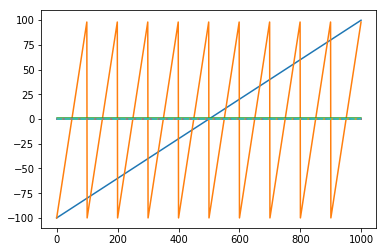

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 11


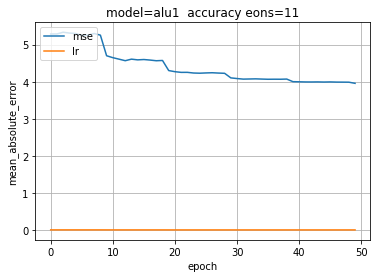

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 101 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 5.1191 - mean_absolute_error: 5.1191
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.1633 - mean_absolute_error: 5.1633
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 5.1911 - mean_absolute_error: 5.1911
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.2084 - mean_absolute_error: 5.2084
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.1857 - mean_absolute_error: 5.1857
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 5.1947 - mean_absolute_error: 5.1947
Epoch 7/50
26000/26000 [==============================] - 3s 118us/step - loss: 5.2449 - mean_absolute_error: 5.2449
Epoch 8/50
26000/26000 [==============================] - 3s 118us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 12


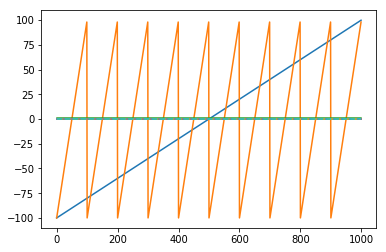

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 12


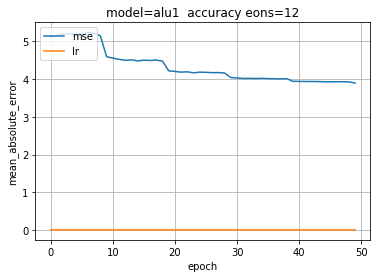

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 102 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 5.1732 - mean_absolute_error: 5.1732
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.1001 - mean_absolute_error: 5.1001
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 5.0573 - mean_absolute_error: 5.0573
Epoch 4/50
26000/26000 [==============================] - 3s 112us/step - loss: 5.1096 - mean_absolute_error: 5.1096
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.1063 - mean_absolute_error: 5.1063
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 5.1122 - mean_absolute_error: 5.1122
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.1361 - mean_absolute_error: 5.1361
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 13


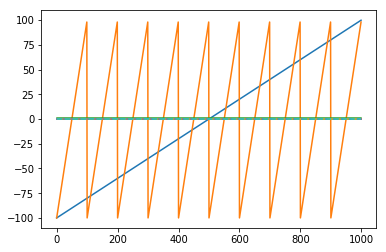

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 13


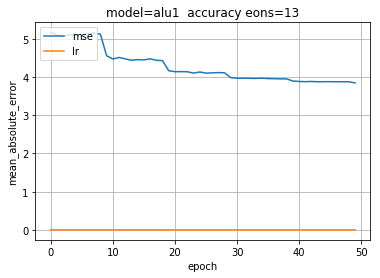

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 103 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 5.0148 - mean_absolute_error: 5.0148
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.0655 - mean_absolute_error: 5.0655
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 5.1060 - mean_absolute_error: 5.1060
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 5.0502 - mean_absolute_error: 5.0502
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 5.0127 - mean_absolute_error: 5.0127
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 5.0659 - mean_absolute_error: 5.0659
Epoch 7/50
26000/26000 [==============================] - 3s 118us/step - loss: 5.0800 - mean_absolute_error: 5.0800
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 14


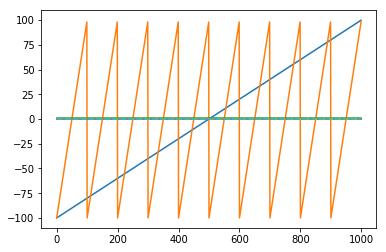

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 14


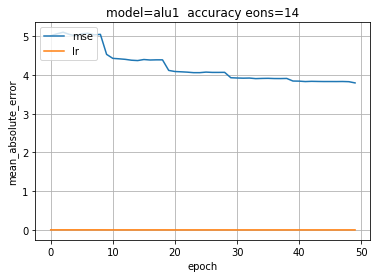

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 104 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 124us/step - loss: 4.8932 - mean_absolute_error: 4.8932
Epoch 2/50
26000/26000 [==============================] - 3s 121us/step - loss: 4.9883 - mean_absolute_error: 4.9883
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.9948 - mean_absolute_error: 4.9948
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.0124 - mean_absolute_error: 5.0124
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.0318 - mean_absolute_error: 5.0318
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 5.1524 - mean_absolute_error: 5.1524
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.9891 - mean_absolute_error: 4.9891
Epoch 8/50
26000/26000 [==============================] - 3s 117us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 15


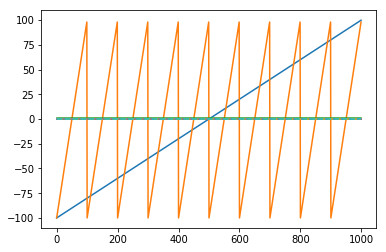

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 15


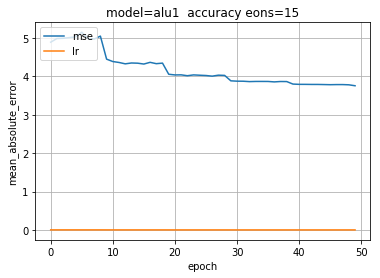

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 105 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.9100 - mean_absolute_error: 4.9100
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.9677 - mean_absolute_error: 4.9677
Epoch 3/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.9612 - mean_absolute_error: 4.9612
Epoch 4/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.9253 - mean_absolute_error: 4.9253
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.9751 - mean_absolute_error: 4.9751
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.9691 - mean_absolute_error: 4.9691
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.8817 - mean_absolute_error: 4.8817
Epoch 8/50
26000/26000 [==============================] - 3s 112us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 16


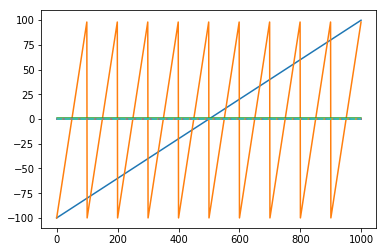

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 16


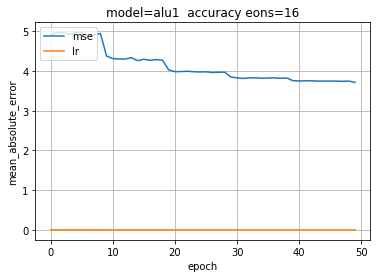

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 106 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 4.8650 - mean_absolute_error: 4.8650
Epoch 2/50
26000/26000 [==============================] - 3s 118us/step - loss: 4.9134 - mean_absolute_error: 4.9134
Epoch 3/50
26000/26000 [==============================] - 3s 122us/step - loss: 4.9337 - mean_absolute_error: 4.9337
Epoch 4/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.9307 - mean_absolute_error: 4.9307
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.8629 - mean_absolute_error: 4.8629
Epoch 6/50
26000/26000 [==============================] - 3s 109us/step - loss: 4.9344 - mean_absolute_error: 4.9344
Epoch 7/50
26000/26000 [==============================] - 3s 110us/step - loss: 4.8879 - mean_absolute_error: 4.8879
Epoch 8/50
26000/26000 [==============================] - 3s 117us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 17


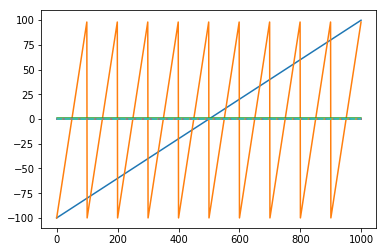

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 17


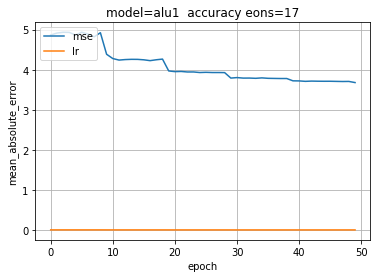

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 107 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 4.7950 - mean_absolute_error: 4.7950
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.8621 - mean_absolute_error: 4.8621
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.8626 - mean_absolute_error: 4.8626
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.8493 - mean_absolute_error: 4.8493
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.8208 - mean_absolute_error: 4.8208
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.8430 - mean_absolute_error: 4.8430
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.7856 - mean_absolute_error: 4.7856
Epoch 8/50
26000/26000 [==============================] - 3s 112us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 18


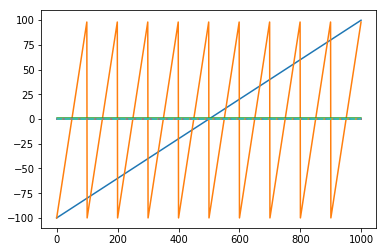

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 18


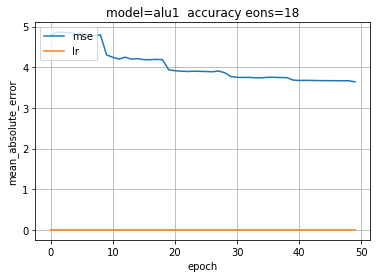

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 108 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 4.8435 - mean_absolute_error: 4.8435
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.8357 - mean_absolute_error: 4.8357
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.8571 - mean_absolute_error: 4.8571
Epoch 4/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.7844 - mean_absolute_error: 4.7844
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.7118 - mean_absolute_error: 4.7118
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.8061 - mean_absolute_error: 4.8061
Epoch 7/50
26000/26000 [==============================] - 3s 121us/step - loss: 4.7632 - mean_absolute_error: 4.7632
Epoch 8/50
26000/26000 [==============================] - 3s 120us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 19


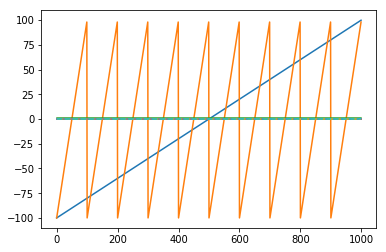

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 19


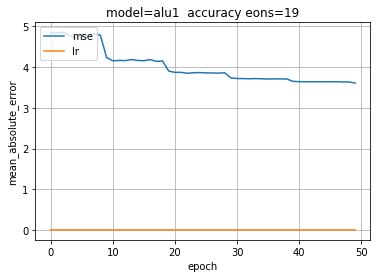

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 109 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 4.7450 - mean_absolute_error: 4.7450
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.7494 - mean_absolute_error: 4.7494
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 4.7021 - mean_absolute_error: 4.7021
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.7573 - mean_absolute_error: 4.7573
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.6870 - mean_absolute_error: 4.6870
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.7729 - mean_absolute_error: 4.7729
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.7477 - mean_absolute_error: 4.7477
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 20


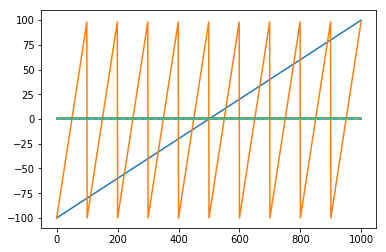

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 20


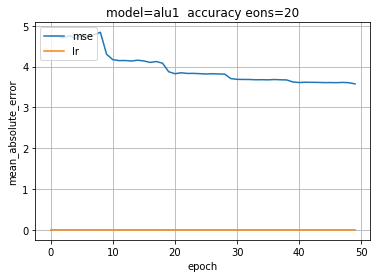

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 110 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 4.6513 - mean_absolute_error: 4.6513
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.7842 - mean_absolute_error: 4.7842
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.7004 - mean_absolute_error: 4.7004
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.7222 - mean_absolute_error: 4.7222
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.7115 - mean_absolute_error: 4.7115
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.6782 - mean_absolute_error: 4.6782
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.6606 - mean_absolute_error: 4.6606
Epoch 8/50
26000/26000 [==============================] - 3s 112us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 21


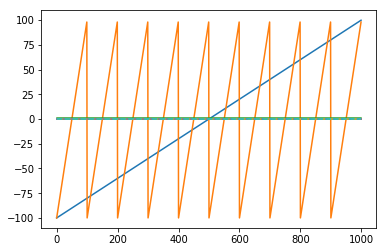

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 21


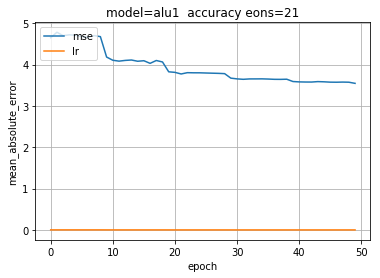

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 111 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.6061 - mean_absolute_error: 4.6061
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.6511 - mean_absolute_error: 4.6511
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.6963 - mean_absolute_error: 4.6963
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.6301 - mean_absolute_error: 4.6301
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.7242 - mean_absolute_error: 4.7242
Epoch 6/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6374 - mean_absolute_error: 4.6374
Epoch 7/50
26000/26000 [==============================] - 3s 111us/step - loss: 4.6750 - mean_absolute_error: 4.6750
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 22


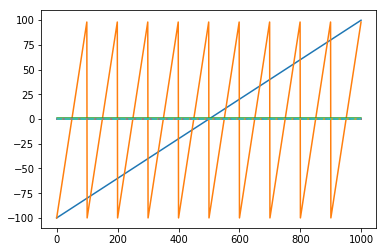

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 22


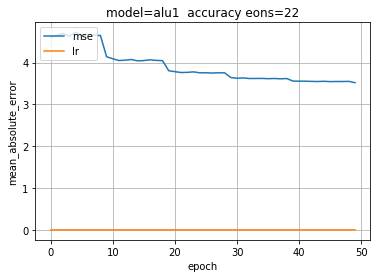

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 112 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 110us/step - loss: 4.5506 - mean_absolute_error: 4.5506
Epoch 2/50
26000/26000 [==============================] - 3s 110us/step - loss: 4.5950 - mean_absolute_error: 4.5950
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.6118 - mean_absolute_error: 4.6118
Epoch 4/50
26000/26000 [==============================] - 3s 110us/step - loss: 4.6859 - mean_absolute_error: 4.6859
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.7070 - mean_absolute_error: 4.7070
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.6516 - mean_absolute_error: 4.6516
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6681 - mean_absolute_error: 4.6681
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 23


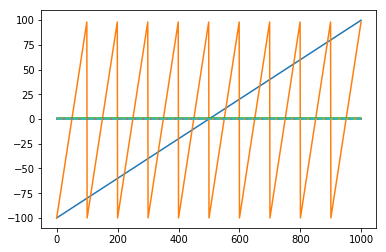

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 23


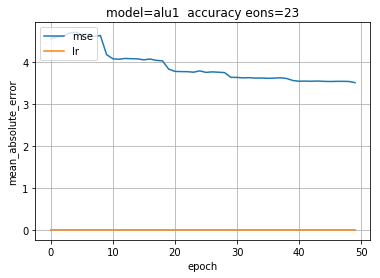

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 113 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 119us/step - loss: 4.5551 - mean_absolute_error: 4.5551
Epoch 2/50
26000/26000 [==============================] - 3s 120us/step - loss: 4.6955 - mean_absolute_error: 4.6955
Epoch 3/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.6209 - mean_absolute_error: 4.6209
Epoch 4/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.5525 - mean_absolute_error: 4.5525
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6243 - mean_absolute_error: 4.6243
Epoch 6/50
26000/26000 [==============================] - 3s 118us/step - loss: 4.6837 - mean_absolute_error: 4.6837
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6290 - mean_absolute_error: 4.6290
Epoch 8/50
26000/26000 [==============================] - 3s 118us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 24


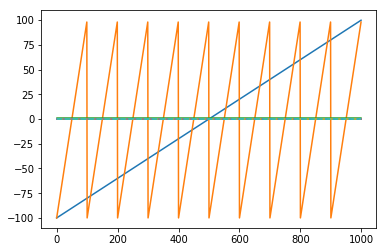

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 24


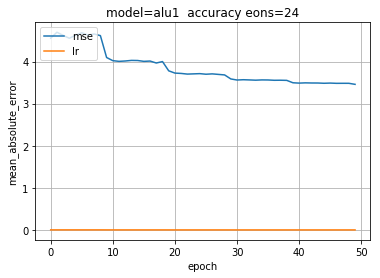

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 114 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.4627 - mean_absolute_error: 4.4627
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.5346 - mean_absolute_error: 4.5346
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.6035 - mean_absolute_error: 4.6035
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5521 - mean_absolute_error: 4.5521
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.5835 - mean_absolute_error: 4.5835
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.5585 - mean_absolute_error: 4.5585
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5497 - mean_absolute_error: 4.5497
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 25


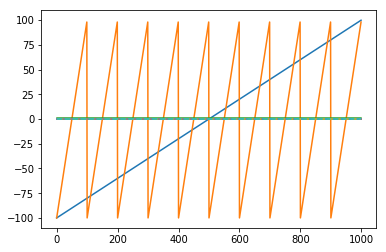

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 25


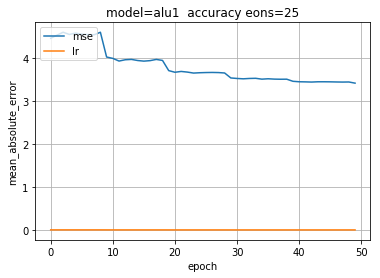

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 115 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 4.4619 - mean_absolute_error: 4.4619
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.4880 - mean_absolute_error: 4.4880
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5604 - mean_absolute_error: 4.5604
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5550 - mean_absolute_error: 4.5550
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.4767 - mean_absolute_error: 4.4767
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.5609 - mean_absolute_error: 4.5609
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.4446 - mean_absolute_error: 4.4446
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 26


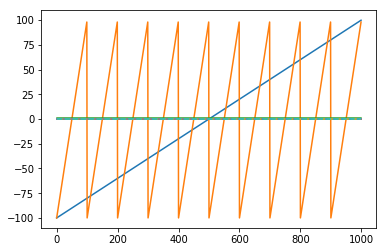

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 26


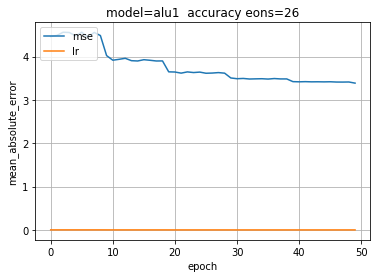

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 116 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 4.4827 - mean_absolute_error: 4.4827
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.5130 - mean_absolute_error: 4.5130
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.4359 - mean_absolute_error: 4.4359
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.4955 - mean_absolute_error: 4.4955
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.4492 - mean_absolute_error: 4.4492
Epoch 6/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.4185 - mean_absolute_error: 4.4185
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.4545 - mean_absolute_error: 4.4545
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 27


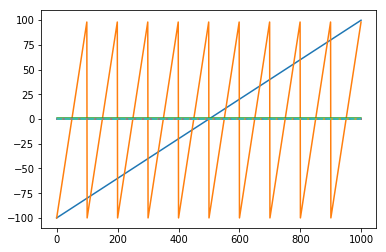

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 27


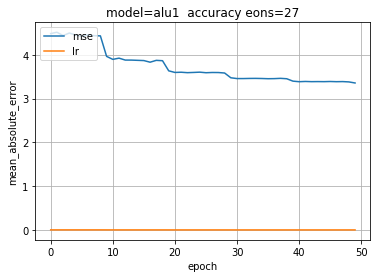

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 117 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 119us/step - loss: 4.5025 - mean_absolute_error: 4.5025
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3766 - mean_absolute_error: 4.3766
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3753 - mean_absolute_error: 4.3753
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.4221 - mean_absolute_error: 4.4221
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.4372 - mean_absolute_error: 4.4372
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.4449 - mean_absolute_error: 4.4449
Epoch 7/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.4484 - mean_absolute_error: 4.4484
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 28


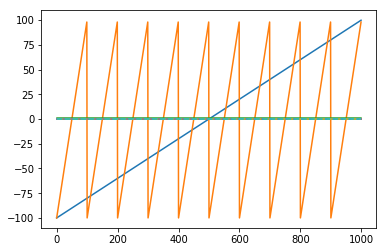

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 28


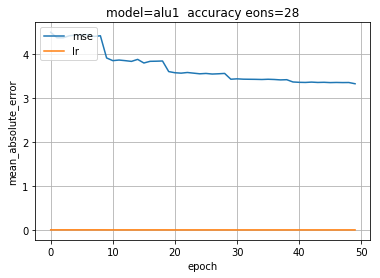

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 118 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 4.4828 - mean_absolute_error: 4.4828
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3363 - mean_absolute_error: 4.3363
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.3511 - mean_absolute_error: 4.3511
Epoch 4/50
26000/26000 [==============================] - 3s 118us/step - loss: 4.3407 - mean_absolute_error: 4.3407
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3771 - mean_absolute_error: 4.3771
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.3326 - mean_absolute_error: 4.3326
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.4209 - mean_absolute_error: 4.4209
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 29


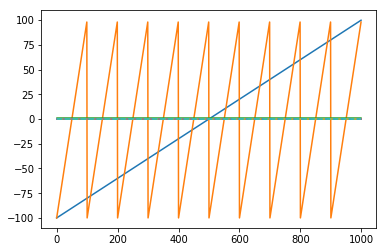

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 29


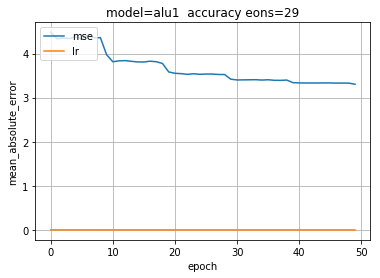

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 119 model= alu1 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 120us/step - loss: 4.3688 - mean_absolute_error: 4.3688
Epoch 2/50
26000/26000 [==============================] - 3s 122us/step - loss: 4.3687 - mean_absolute_error: 4.3687
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.3089 - mean_absolute_error: 4.3089
Epoch 4/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3070 - mean_absolute_error: 4.3070
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.3802 - mean_absolute_error: 4.3802
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.3804 - mean_absolute_error: 4.3804
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.4083 - mean_absolute_error: 4.4083
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 30


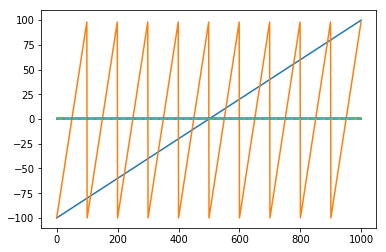

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 30


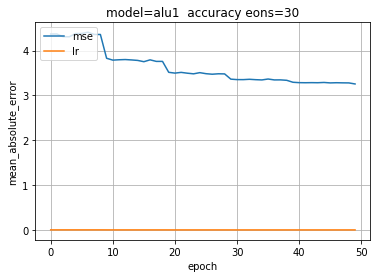

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 120 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 6.2611 - mean_absolute_error: 6.2611
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 5.7290 - mean_absolute_error: 5.7290
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.6197 - mean_absolute_error: 5.6197
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 5.4461 - mean_absolute_error: 5.4461
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 5.4374 - mean_absolute_error: 5.4374
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 5.3108 - mean_absolute_error: 5.3108
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 5.3470 - mean_absolute_error: 5.3470
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 31


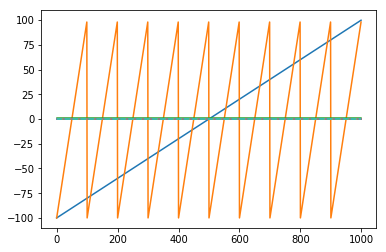

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 31


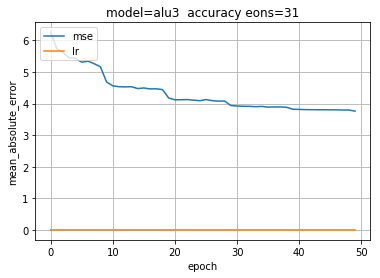

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 121 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 112us/step - loss: 5.0315 - mean_absolute_error: 5.0315
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 5.0069 - mean_absolute_error: 5.0069
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 5.1029 - mean_absolute_error: 5.1029
Epoch 4/50
26000/26000 [==============================] - 3s 122us/step - loss: 5.0039 - mean_absolute_error: 5.0039
Epoch 5/50
26000/26000 [==============================] - 3s 111us/step - loss: 5.0577 - mean_absolute_error: 5.0577
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 5.0365 - mean_absolute_error: 5.0365
Epoch 7/50
26000/26000 [==============================] - 3s 109us/step - loss: 4.9988 - mean_absolute_error: 4.9988
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 32


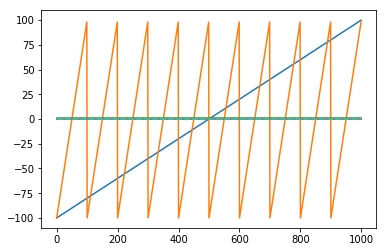

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 32


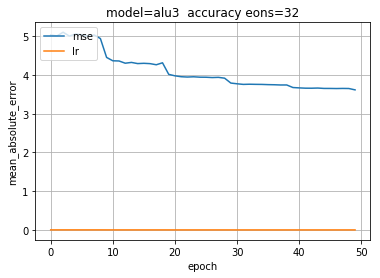

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 122 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.8714 - mean_absolute_error: 4.8714
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.9128 - mean_absolute_error: 4.9128
Epoch 3/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.9245 - mean_absolute_error: 4.9245
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.8131 - mean_absolute_error: 4.8131
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.8863 - mean_absolute_error: 4.8863
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.8416 - mean_absolute_error: 4.8416
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.8915 - mean_absolute_error: 4.8915
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 33


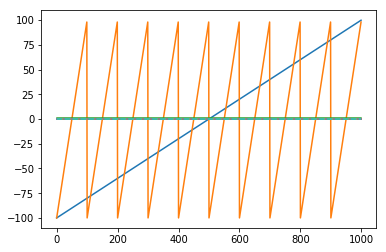

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 33


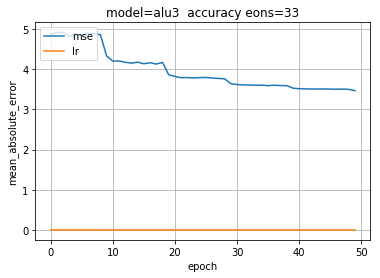

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 123 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.6773 - mean_absolute_error: 4.6773
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.7505 - mean_absolute_error: 4.7505
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.8003 - mean_absolute_error: 4.8003
Epoch 4/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.7848 - mean_absolute_error: 4.7848
Epoch 5/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.7567 - mean_absolute_error: 4.7567
Epoch 6/50
26000/26000 [==============================] - 3s 121us/step - loss: 4.7463 - mean_absolute_error: 4.7463
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.7498 - mean_absolute_error: 4.7498
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 34


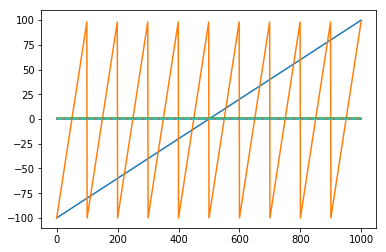

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 34


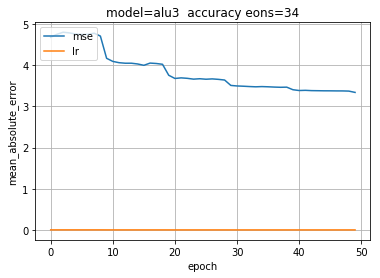

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 124 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.5440 - mean_absolute_error: 4.5440
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.6449 - mean_absolute_error: 4.6449
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6590 - mean_absolute_error: 4.6590
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.6428 - mean_absolute_error: 4.6428
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6443 - mean_absolute_error: 4.6443
Epoch 6/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.6150 - mean_absolute_error: 4.6150
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.6067 - mean_absolute_error: 4.6067
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 35


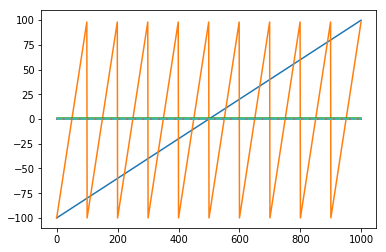

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 35


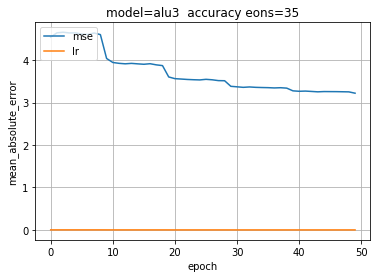

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 125 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 4.4486 - mean_absolute_error: 4.4486
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 4.6412 - mean_absolute_error: 4.6412
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.4781 - mean_absolute_error: 4.4781
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5024 - mean_absolute_error: 4.5024
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.5077 - mean_absolute_error: 4.5077
Epoch 6/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.4979 - mean_absolute_error: 4.4979
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.5043 - mean_absolute_error: 4.5043
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 36


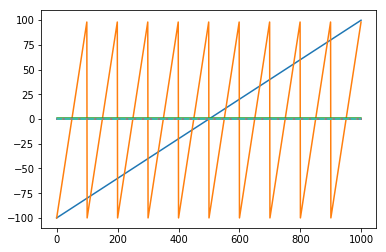

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 36


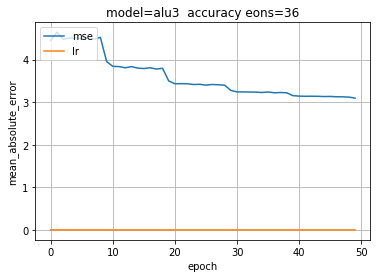

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 126 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 4.3351 - mean_absolute_error: 4.3351
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.4083 - mean_absolute_error: 4.4083
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.3732 - mean_absolute_error: 4.3732
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.3599 - mean_absolute_error: 4.3599
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.4376 - mean_absolute_error: 4.4376
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.3904 - mean_absolute_error: 4.3904
Epoch 7/50
26000/26000 [==============================] - 3s 111us/step - loss: 4.3839 - mean_absolute_error: 4.3839
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 37


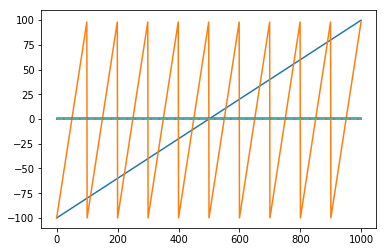

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 37


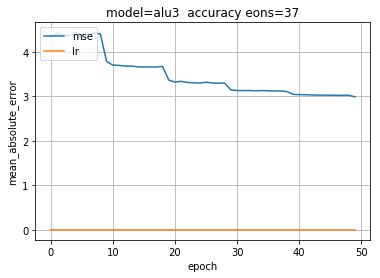

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 127 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 4.2939 - mean_absolute_error: 4.2939
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.3051 - mean_absolute_error: 4.3051
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.3068 - mean_absolute_error: 4.3068
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.2601 - mean_absolute_error: 4.2601
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.3555 - mean_absolute_error: 4.3555
Epoch 6/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.2784 - mean_absolute_error: 4.2784
Epoch 7/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.3092 - mean_absolute_error: 4.3092
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 38


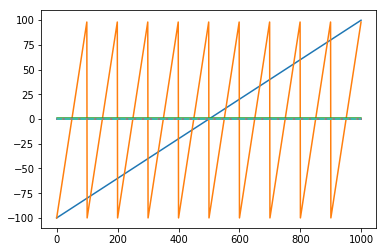

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 38


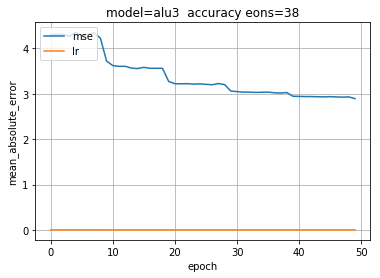

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 128 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 4.1061 - mean_absolute_error: 4.1061
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 4.2155 - mean_absolute_error: 4.2155
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.2216 - mean_absolute_error: 4.2216
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.2816 - mean_absolute_error: 4.2816
Epoch 5/50
26000/26000 [==============================] - 3s 110us/step - loss: 4.1910 - mean_absolute_error: 4.1910
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.1329 - mean_absolute_error: 4.1329
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.2158 - mean_absolute_error: 4.2158
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 39


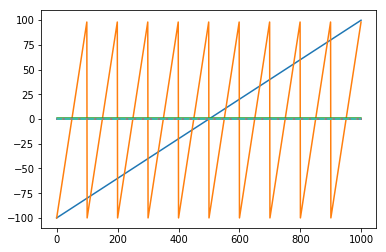

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 39


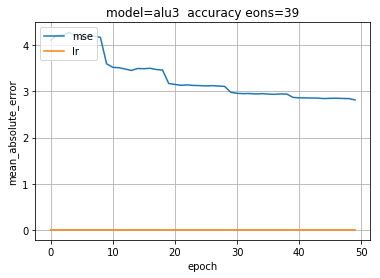

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 129 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 4.1041 - mean_absolute_error: 4.1041
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.0834 - mean_absolute_error: 4.0834
Epoch 3/50
26000/26000 [==============================] - 3s 118us/step - loss: 4.0731 - mean_absolute_error: 4.0731
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.1476 - mean_absolute_error: 4.1476
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 4.1001 - mean_absolute_error: 4.1001
Epoch 6/50
26000/26000 [==============================] - 3s 119us/step - loss: 4.1022 - mean_absolute_error: 4.1022
Epoch 7/50
26000/26000 [==============================] - 3s 120us/step - loss: 4.0868 - mean_absolute_error: 4.0868
Epoch 8/50
26000/26000 [==============================] - 3s 118us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 40


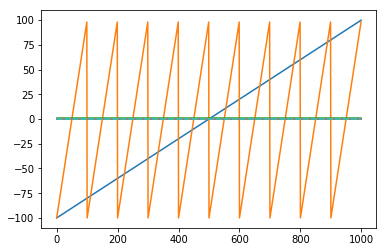

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 40


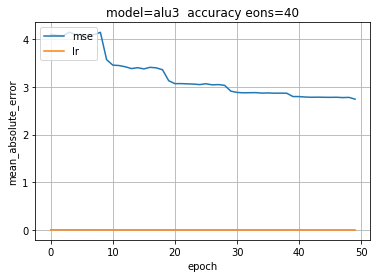

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 130 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 4.0212 - mean_absolute_error: 4.0212
Epoch 2/50
26000/26000 [==============================] - 3s 118us/step - loss: 4.0075 - mean_absolute_error: 4.0075
Epoch 3/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.0262 - mean_absolute_error: 4.0262
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.0268 - mean_absolute_error: 4.0268
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.0650 - mean_absolute_error: 4.0650
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 4.0375 - mean_absolute_error: 4.0375
Epoch 7/50
26000/26000 [==============================] - 3s 117us/step - loss: 4.0207 - mean_absolute_error: 4.0207
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 41


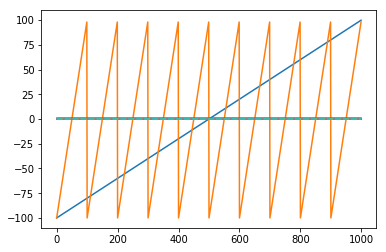

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 41


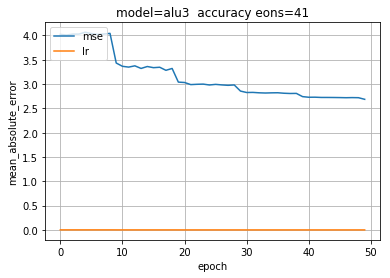

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 131 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 117us/step - loss: 3.9444 - mean_absolute_error: 3.9444
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.9459 - mean_absolute_error: 3.9459
Epoch 3/50
26000/26000 [==============================] - 3s 119us/step - loss: 3.9418 - mean_absolute_error: 3.9418
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 4.0098 - mean_absolute_error: 4.0098
Epoch 5/50
26000/26000 [==============================] - 3s 111us/step - loss: 3.9562 - mean_absolute_error: 3.9562
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 4.0335 - mean_absolute_error: 4.0335
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.9762 - mean_absolute_error: 3.9762
Epoch 8/50
26000/26000 [==============================] - 3s 120us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 42


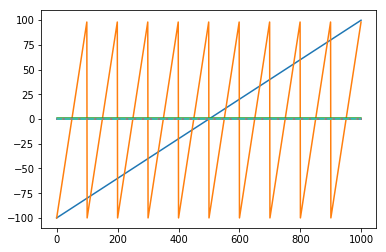

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 42


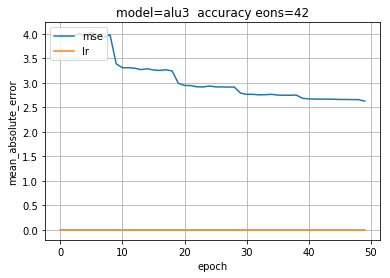

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 132 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 3.8464 - mean_absolute_error: 3.8464
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 3.9143 - mean_absolute_error: 3.9143
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.8906 - mean_absolute_error: 3.8906
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.8742 - mean_absolute_error: 3.8742
Epoch 5/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.8883 - mean_absolute_error: 3.8883
Epoch 6/50
26000/26000 [==============================] - 3s 119us/step - loss: 3.8748 - mean_absolute_error: 3.8748
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.8685 - mean_absolute_error: 3.8685
Epoch 8/50
26000/26000 [==============================] - 3s 117us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 43


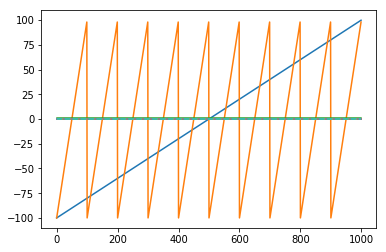

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 43


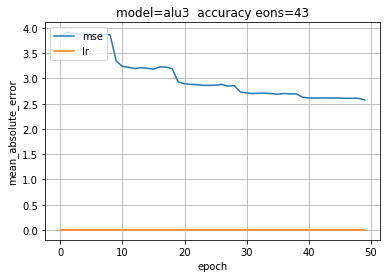

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 133 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 117us/step - loss: 3.7510 - mean_absolute_error: 3.7510
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.8765 - mean_absolute_error: 3.8765
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.8366 - mean_absolute_error: 3.8366
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.8960 - mean_absolute_error: 3.8960
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.9467 - mean_absolute_error: 3.9467
Epoch 6/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.8188 - mean_absolute_error: 3.8188
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.8865 - mean_absolute_error: 3.8865
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 44


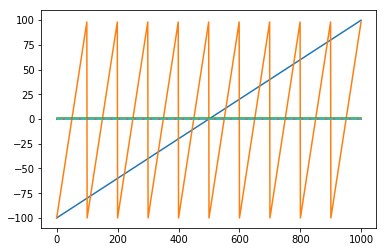

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 44


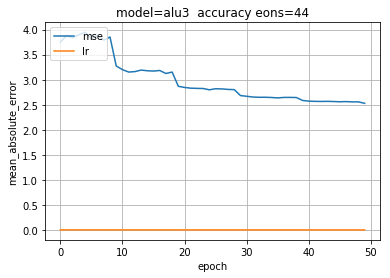

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 134 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 3.7337 - mean_absolute_error: 3.7337
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.7573 - mean_absolute_error: 3.7573
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.8119 - mean_absolute_error: 3.8119
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.7833 - mean_absolute_error: 3.7833
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.8515 - mean_absolute_error: 3.8515
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.7611 - mean_absolute_error: 3.7611
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 3.7872 - mean_absolute_error: 3.7872
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 45


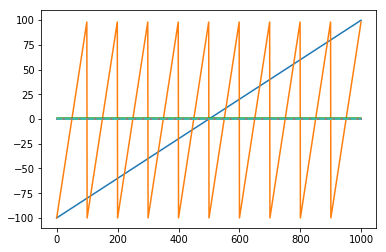

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 45


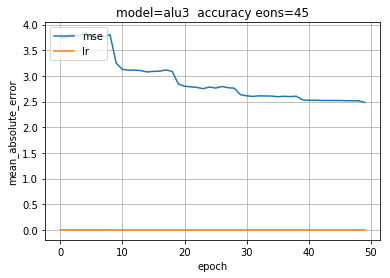

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 135 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 3.6595 - mean_absolute_error: 3.6595
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 3.7332 - mean_absolute_error: 3.7332
Epoch 3/50
26000/26000 [==============================] - 3s 117us/step - loss: 3.7076 - mean_absolute_error: 3.7076
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.7032 - mean_absolute_error: 3.7032
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 3.7482 - mean_absolute_error: 3.7482
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 3.7254 - mean_absolute_error: 3.7254
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.7253 - mean_absolute_error: 3.7253
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 46


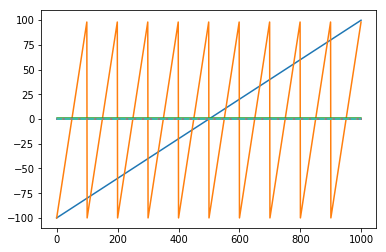

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 46


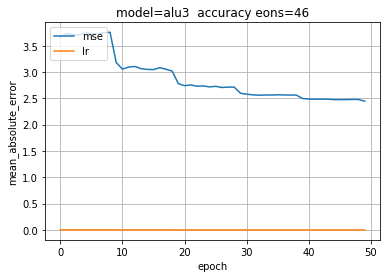

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 136 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 3.5846 - mean_absolute_error: 3.5846
Epoch 2/50
26000/26000 [==============================] - 3s 109us/step - loss: 3.6748 - mean_absolute_error: 3.6748
Epoch 3/50
26000/26000 [==============================] - 3s 110us/step - loss: 3.7444 - mean_absolute_error: 3.7444
Epoch 4/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.6960 - mean_absolute_error: 3.6960
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.6238 - mean_absolute_error: 3.6238
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 3.5944 - mean_absolute_error: 3.5944
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.6086 - mean_absolute_error: 3.6086
Epoch 8/50
26000/26000 [==============================] - 3s 110us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 47


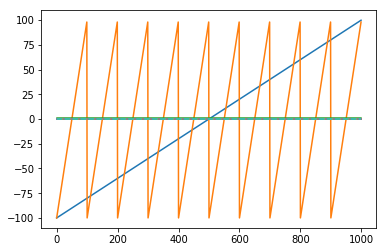

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 47


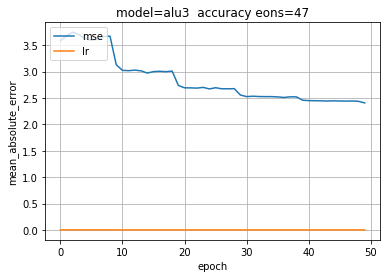

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 137 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 118us/step - loss: 3.5761 - mean_absolute_error: 3.5761
Epoch 2/50
26000/26000 [==============================] - 3s 116us/step - loss: 3.6059 - mean_absolute_error: 3.6059
Epoch 3/50
26000/26000 [==============================] - 3s 121us/step - loss: 3.6803 - mean_absolute_error: 3.6803
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.6191 - mean_absolute_error: 3.6191
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.5893 - mean_absolute_error: 3.5893
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.6241 - mean_absolute_error: 3.6241
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.6095 - mean_absolute_error: 3.6095
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 48


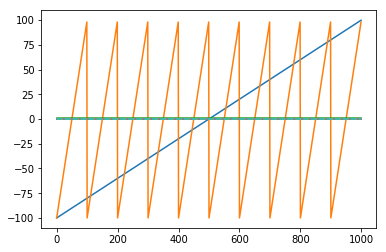

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 48


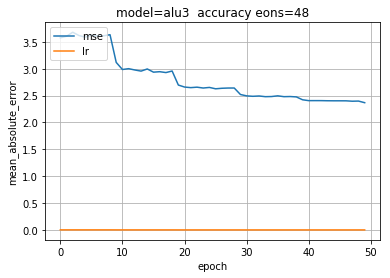

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 138 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 119us/step - loss: 3.5913 - mean_absolute_error: 3.5913
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.6551 - mean_absolute_error: 3.6551
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.6206 - mean_absolute_error: 3.6206
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.5597 - mean_absolute_error: 3.5597
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.5518 - mean_absolute_error: 3.5518
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.5700 - mean_absolute_error: 3.5700
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.5363 - mean_absolute_error: 3.5363
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 49


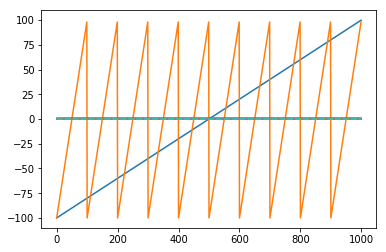

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 49


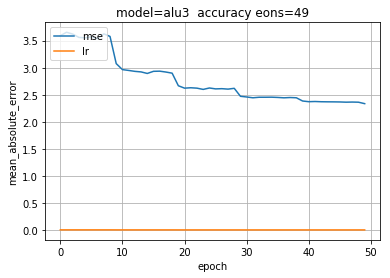

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 139 model= alu3 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 119us/step - loss: 3.4931 - mean_absolute_error: 3.4931
Epoch 2/50
26000/26000 [==============================] - 3s 121us/step - loss: 3.4738 - mean_absolute_error: 3.4738
Epoch 3/50
26000/26000 [==============================] - 3s 119us/step - loss: 3.5605 - mean_absolute_error: 3.5605
Epoch 4/50
26000/26000 [==============================] - 3s 117us/step - loss: 3.5173 - mean_absolute_error: 3.5173
Epoch 5/50
26000/26000 [==============================] - 3s 115us/step - loss: 3.5429 - mean_absolute_error: 3.5429
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 3.4886 - mean_absolute_error: 3.4886
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 3.5369 - mean_absolute_error: 3.5369
Epoch 8/50
26000/26000 [==============================] - 3s 112us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 50


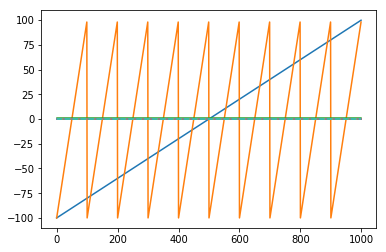

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 50


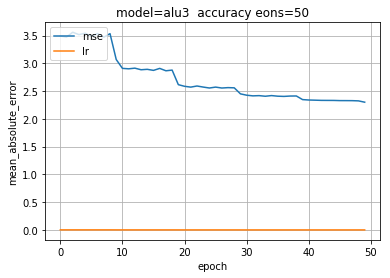

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 140 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 4s 136us/step - loss: 6.2599 - mean_absolute_error: 6.2599
Epoch 2/50
26000/26000 [==============================] - 3s 132us/step - loss: 5.2776 - mean_absolute_error: 5.2776
Epoch 3/50
26000/26000 [==============================] - 3s 130us/step - loss: 5.0286 - mean_absolute_error: 5.0286
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.9329 - mean_absolute_error: 4.9329
Epoch 5/50
26000/26000 [==============================] - 4s 135us/step - loss: 4.7685 - mean_absolute_error: 4.7685
Epoch 6/50
26000/26000 [==============================] - 3s 134us/step - loss: 4.7172 - mean_absolute_error: 4.7172
Epoch 7/50
26000/26000 [==============================] - 4s 135us/step - loss: 4.7407 - mean_absolute_error: 4.7407
Epoch 8/50
26000/26000 [==============================] - 3s 134us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 51


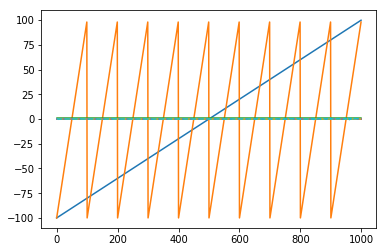

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 51


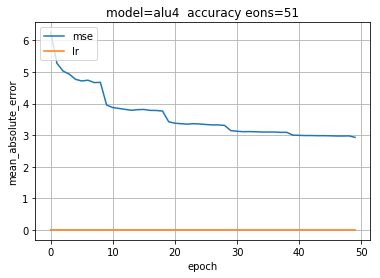

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 141 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 4s 135us/step - loss: 4.4374 - mean_absolute_error: 4.4374
Epoch 2/50
26000/26000 [==============================] - 3s 134us/step - loss: 4.4930 - mean_absolute_error: 4.4930
Epoch 3/50
26000/26000 [==============================] - 4s 135us/step - loss: 4.4791 - mean_absolute_error: 4.4791
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 4.4900 - mean_absolute_error: 4.4900
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 4.4364 - mean_absolute_error: 4.4364
Epoch 6/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.5014 - mean_absolute_error: 4.5014
Epoch 7/50
26000/26000 [==============================] - 3s 129us/step - loss: 4.4727 - mean_absolute_error: 4.4727
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 52


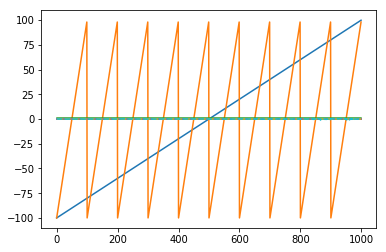

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 52


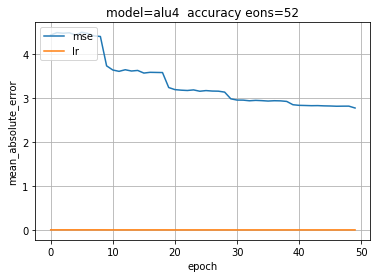

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 142 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 4s 136us/step - loss: 4.3516 - mean_absolute_error: 4.3516
Epoch 2/50
26000/26000 [==============================] - 3s 130us/step - loss: 4.3322 - mean_absolute_error: 4.3322
Epoch 3/50
26000/26000 [==============================] - 4s 136us/step - loss: 4.3352 - mean_absolute_error: 4.3352
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 4.3017 - mean_absolute_error: 4.3017
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 4.3294 - mean_absolute_error: 4.3294
Epoch 6/50
26000/26000 [==============================] - 4s 135us/step - loss: 4.3561 - mean_absolute_error: 4.3561
Epoch 7/50
26000/26000 [==============================] - 3s 130us/step - loss: 4.2877 - mean_absolute_error: 4.2877
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 53


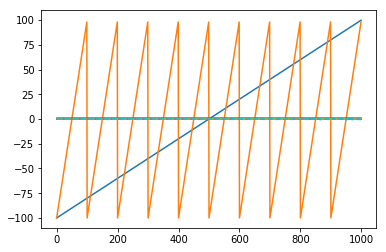

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 53


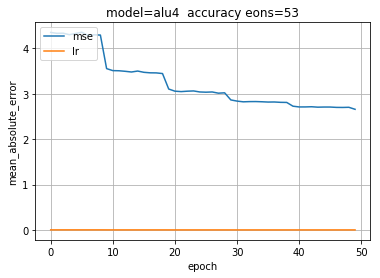

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 143 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 4.0753 - mean_absolute_error: 4.0753
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.1495 - mean_absolute_error: 4.1495
Epoch 3/50
26000/26000 [==============================] - 4s 135us/step - loss: 4.2409 - mean_absolute_error: 4.2409
Epoch 4/50
26000/26000 [==============================] - 4s 136us/step - loss: 4.1771 - mean_absolute_error: 4.1771
Epoch 5/50
26000/26000 [==============================] - 4s 136us/step - loss: 4.2606 - mean_absolute_error: 4.2606
Epoch 6/50
26000/26000 [==============================] - 4s 137us/step - loss: 4.1465 - mean_absolute_error: 4.1465
Epoch 7/50
26000/26000 [==============================] - 4s 136us/step - loss: 4.2125 - mean_absolute_error: 4.2125
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 54


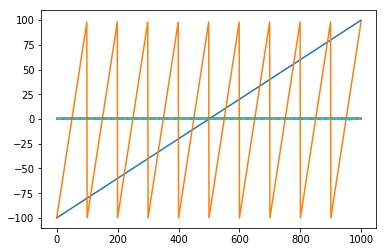

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 54


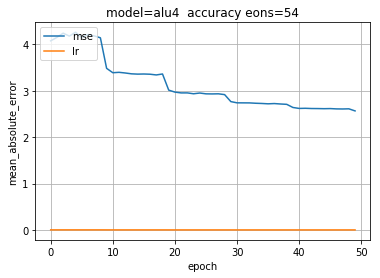

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 144 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 134us/step - loss: 4.0672 - mean_absolute_error: 4.0672
Epoch 2/50
26000/26000 [==============================] - 3s 128us/step - loss: 4.0397 - mean_absolute_error: 4.0397
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.1538 - mean_absolute_error: 4.1538
Epoch 4/50
26000/26000 [==============================] - 3s 134us/step - loss: 4.0601 - mean_absolute_error: 4.0601
Epoch 5/50
26000/26000 [==============================] - 3s 135us/step - loss: 4.0588 - mean_absolute_error: 4.0588
Epoch 6/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.0670 - mean_absolute_error: 4.0670
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 4.0568 - mean_absolute_error: 4.0568
Epoch 8/50
26000/26000 [==============================] - 4s 135us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 55


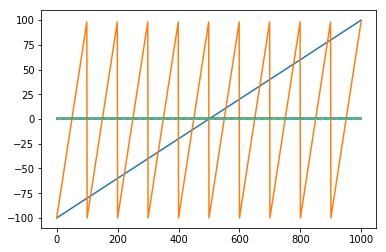

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 55


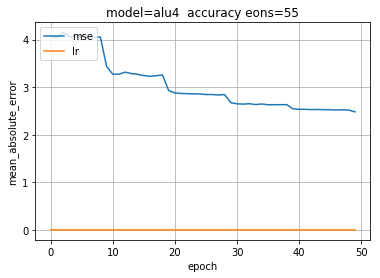

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 145 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 3.9231 - mean_absolute_error: 3.9231
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.9365 - mean_absolute_error: 3.9365
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 4.0312 - mean_absolute_error: 4.0312
Epoch 4/50
26000/26000 [==============================] - 3s 132us/step - loss: 4.0734 - mean_absolute_error: 4.0734
Epoch 5/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.9858 - mean_absolute_error: 3.9858
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.9929 - mean_absolute_error: 3.9929
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.9948 - mean_absolute_error: 3.9948
Epoch 8/50
26000/26000 [==============================] - 3s 134us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 56


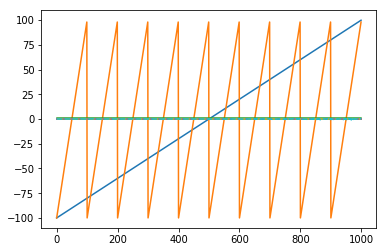

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 56


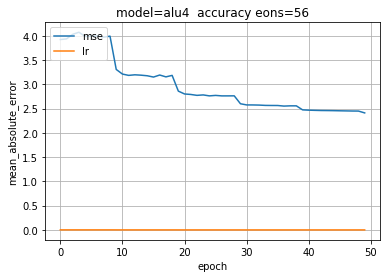

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 146 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 128us/step - loss: 3.8798 - mean_absolute_error: 3.8798
Epoch 2/50
26000/26000 [==============================] - 3s 128us/step - loss: 3.9706 - mean_absolute_error: 3.9706
Epoch 3/50
26000/26000 [==============================] - 3s 126us/step - loss: 3.9018 - mean_absolute_error: 3.9018
Epoch 4/50
26000/26000 [==============================] - 3s 124us/step - loss: 3.8826 - mean_absolute_error: 3.8826
Epoch 5/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.9698 - mean_absolute_error: 3.9698
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.9256 - mean_absolute_error: 3.9256
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.9173 - mean_absolute_error: 3.9173
Epoch 8/50
26000/26000 [==============================] - 3s 129us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 57


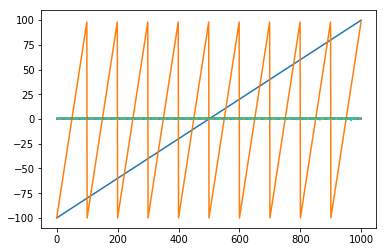

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 57


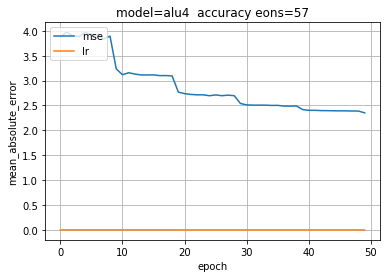

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 147 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 127us/step - loss: 3.8124 - mean_absolute_error: 3.8124
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.8431 - mean_absolute_error: 3.8431
Epoch 3/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.8868 - mean_absolute_error: 3.8868
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.8739 - mean_absolute_error: 3.8739
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.8635 - mean_absolute_error: 3.8635
Epoch 6/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.8253 - mean_absolute_error: 3.8253
Epoch 7/50
26000/26000 [==============================] - 3s 129us/step - loss: 3.8391 - mean_absolute_error: 3.8391
Epoch 8/50
26000/26000 [==============================] - 3s 129us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 58


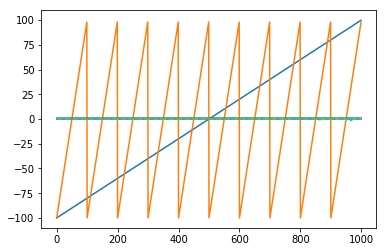

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 58


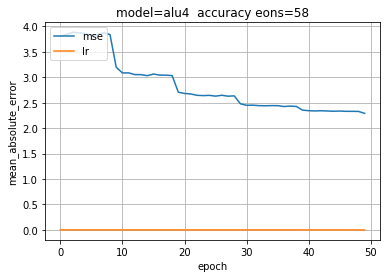

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 148 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 3.6946 - mean_absolute_error: 3.6946
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.7724 - mean_absolute_error: 3.7724
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.7665 - mean_absolute_error: 3.7665
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.7730 - mean_absolute_error: 3.7730
Epoch 5/50
26000/26000 [==============================] - 4s 138us/step - loss: 3.7521 - mean_absolute_error: 3.7521
Epoch 6/50
26000/26000 [==============================] - 4s 138us/step - loss: 3.7616 - mean_absolute_error: 3.7616
Epoch 7/50
26000/26000 [==============================] - 4s 140us/step - loss: 3.8260 - mean_absolute_error: 3.8260
Epoch 8/50
26000/26000 [==============================] - 4s 136us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 59


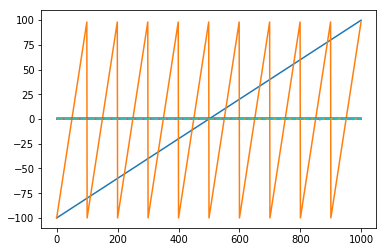

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 59


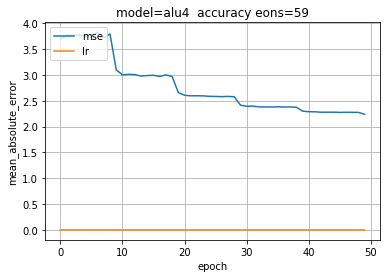

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 149 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 3.6403 - mean_absolute_error: 3.6403
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.7089 - mean_absolute_error: 3.7089
Epoch 3/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.6945 - mean_absolute_error: 3.6945
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.6760 - mean_absolute_error: 3.6760
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.6583 - mean_absolute_error: 3.6583
Epoch 6/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.7144 - mean_absolute_error: 3.7144
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.7113 - mean_absolute_error: 3.7113
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 60


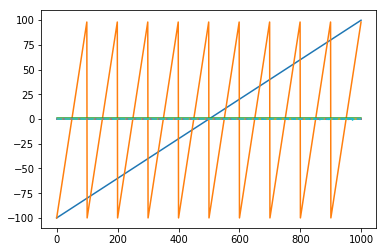

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 60


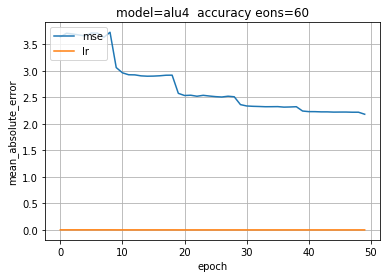

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 150 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 3.6123 - mean_absolute_error: 3.6123
Epoch 2/50
26000/26000 [==============================] - 3s 128us/step - loss: 3.6970 - mean_absolute_error: 3.6970
Epoch 3/50
26000/26000 [==============================] - 3s 128us/step - loss: 3.5950 - mean_absolute_error: 3.5950
Epoch 4/50
26000/26000 [==============================] - 3s 129us/step - loss: 3.6312 - mean_absolute_error: 3.6312
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.6372 - mean_absolute_error: 3.6372
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.6252 - mean_absolute_error: 3.6252
Epoch 7/50
26000/26000 [==============================] - 3s 129us/step - loss: 3.6727 - mean_absolute_error: 3.6727
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 61


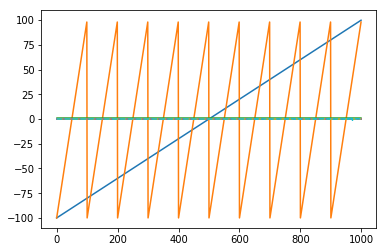

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 61


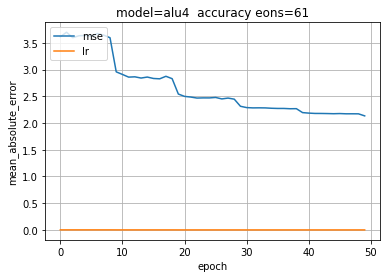

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 151 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 130us/step - loss: 3.5437 - mean_absolute_error: 3.5437
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.5284 - mean_absolute_error: 3.5284
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.5740 - mean_absolute_error: 3.5740
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.5423 - mean_absolute_error: 3.5423
Epoch 5/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.5380 - mean_absolute_error: 3.5380
Epoch 6/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.5400 - mean_absolute_error: 3.5400
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.5475 - mean_absolute_error: 3.5475
Epoch 8/50
26000/26000 [==============================] - 3s 129us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 62


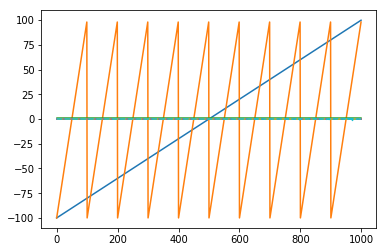

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 62


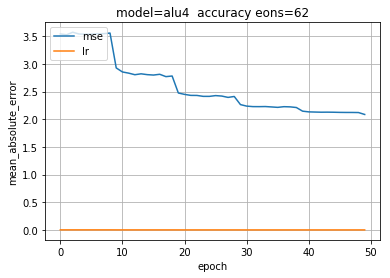

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 152 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 129us/step - loss: 3.4583 - mean_absolute_error: 3.4583
Epoch 2/50
26000/26000 [==============================] - 3s 128us/step - loss: 3.4570 - mean_absolute_error: 3.4570
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.5001 - mean_absolute_error: 3.5001
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.4974 - mean_absolute_error: 3.4974
Epoch 5/50
26000/26000 [==============================] - 4s 136us/step - loss: 3.5015 - mean_absolute_error: 3.5015
Epoch 6/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.4659 - mean_absolute_error: 3.4659
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.5513 - mean_absolute_error: 3.5513
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 63


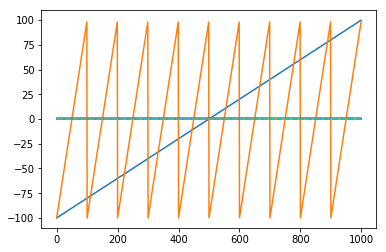

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 63


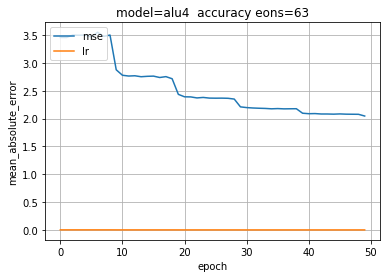

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 153 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 3.4210 - mean_absolute_error: 3.4210
Epoch 2/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.4246 - mean_absolute_error: 3.4246
Epoch 3/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.4334 - mean_absolute_error: 3.4334
Epoch 4/50
26000/26000 [==============================] - 3s 129us/step - loss: 3.4467 - mean_absolute_error: 3.4467
Epoch 5/50
26000/26000 [==============================] - 4s 138us/step - loss: 3.4584 - mean_absolute_error: 3.4584
Epoch 6/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.4731 - mean_absolute_error: 3.4731
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.4478 - mean_absolute_error: 3.4478
Epoch 8/50
26000/26000 [==============================] - 4s 135us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 64


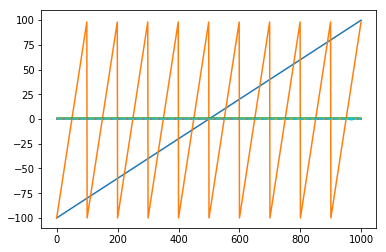

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 64


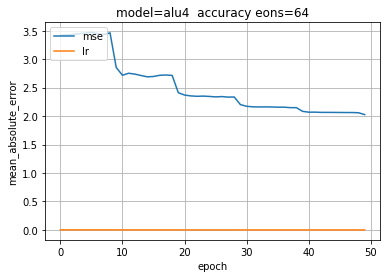

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 154 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 3.3488 - mean_absolute_error: 3.3488
Epoch 2/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.4024 - mean_absolute_error: 3.4024
Epoch 3/50
26000/26000 [==============================] - 4s 138us/step - loss: 3.4530 - mean_absolute_error: 3.4530
Epoch 4/50
26000/26000 [==============================] - 4s 136us/step - loss: 3.3961 - mean_absolute_error: 3.3961
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.4429 - mean_absolute_error: 3.4429
Epoch 6/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.3733 - mean_absolute_error: 3.3733
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.3887 - mean_absolute_error: 3.3887
Epoch 8/50
26000/26000 [==============================] - 3s 133us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 65


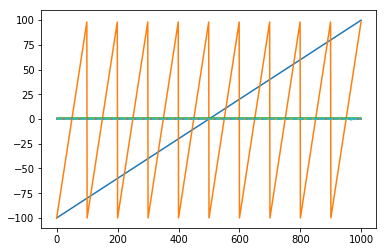

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 65


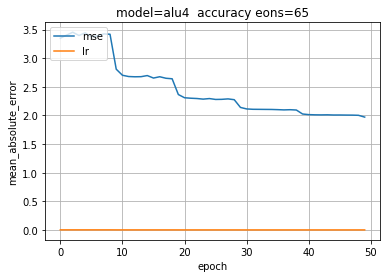

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 155 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 3.2583 - mean_absolute_error: 3.2583
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.4428 - mean_absolute_error: 3.4428
Epoch 3/50
26000/26000 [==============================] - 3s 135us/step - loss: 3.3397 - mean_absolute_error: 3.3397
Epoch 4/50
26000/26000 [==============================] - 3s 127us/step - loss: 3.4124 - mean_absolute_error: 3.4124
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.3475 - mean_absolute_error: 3.3475
Epoch 6/50
26000/26000 [==============================] - 3s 129us/step - loss: 3.2772 - mean_absolute_error: 3.2772
Epoch 7/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.3563 - mean_absolute_error: 3.3563
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 66


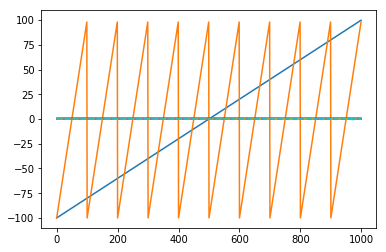

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 66


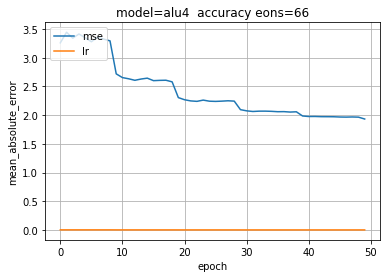

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 156 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 134us/step - loss: 3.2879 - mean_absolute_error: 3.2879
Epoch 2/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.2525 - mean_absolute_error: 3.2525
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.3171 - mean_absolute_error: 3.3171
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.2596 - mean_absolute_error: 3.2596
Epoch 5/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.2318 - mean_absolute_error: 3.2318
Epoch 6/50
26000/26000 [==============================] - 4s 135us/step - loss: 3.2646 - mean_absolute_error: 3.2646
Epoch 7/50
26000/26000 [==============================] - 4s 135us/step - loss: 3.2482 - mean_absolute_error: 3.2482
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 67


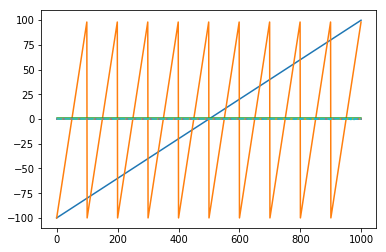

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 67


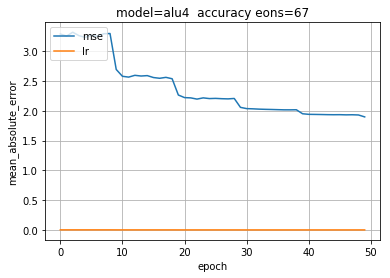

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 157 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 130us/step - loss: 3.2025 - mean_absolute_error: 3.2025
Epoch 2/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.2427 - mean_absolute_error: 3.2427
Epoch 3/50
26000/26000 [==============================] - 4s 141us/step - loss: 3.2665 - mean_absolute_error: 3.2665
Epoch 4/50
26000/26000 [==============================] - 4s 140us/step - loss: 3.1872 - mean_absolute_error: 3.1872
Epoch 5/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.2312 - mean_absolute_error: 3.2312
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.2291 - mean_absolute_error: 3.2291
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.2161 - mean_absolute_error: 3.2161
Epoch 8/50
26000/26000 [==============================] - 3s 128us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 68


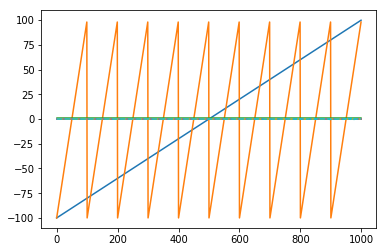

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 68


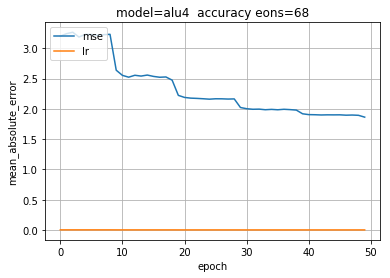

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 158 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 130us/step - loss: 3.1527 - mean_absolute_error: 3.1527
Epoch 2/50
26000/26000 [==============================] - 4s 135us/step - loss: 3.1960 - mean_absolute_error: 3.1960
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 3.1865 - mean_absolute_error: 3.1865
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1869 - mean_absolute_error: 3.1869
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 3.1713 - mean_absolute_error: 3.1713
Epoch 6/50
26000/26000 [==============================] - 3s 134us/step - loss: 3.1982 - mean_absolute_error: 3.1982
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1617 - mean_absolute_error: 3.1617
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 69


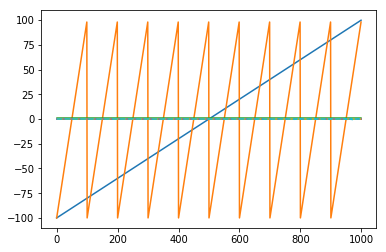

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 69


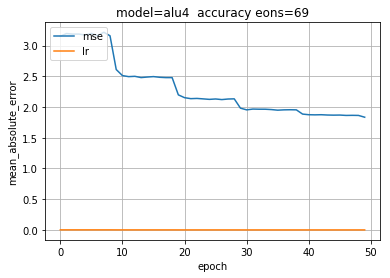

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 159 model= alu4 inp= bin
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 134us/step - loss: 3.0963 - mean_absolute_error: 3.0963
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1764 - mean_absolute_error: 3.1764
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 3.1704 - mean_absolute_error: 3.1704
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1529 - mean_absolute_error: 3.1529
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1239 - mean_absolute_error: 3.1239
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1784 - mean_absolute_error: 3.1784
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 3.1383 - mean_absolute_error: 3.1383
Epoch 8/50
26000/26000 [==============================] - 3s 130us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 70


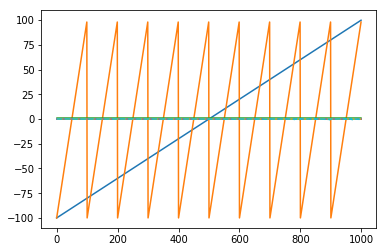

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 70


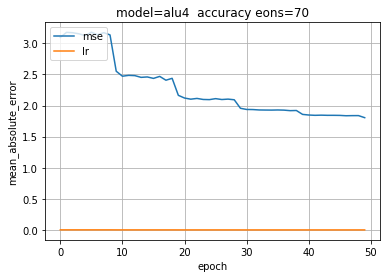

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 160 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 3.7582 - mean_absolute_error: 3.7582
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 2.9198 - mean_absolute_error: 2.9198
Epoch 3/50
26000/26000 [==============================] - 3s 112us/step - loss: 2.5180 - mean_absolute_error: 2.5180
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 2.2430 - mean_absolute_error: 2.2430
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 2.0745 - mean_absolute_error: 2.0745
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 1.9461 - mean_absolute_error: 1.9461
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 1.8738 - mean_absolute_error: 1.8738
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 71


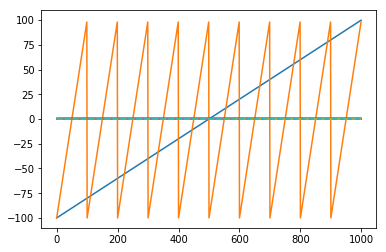

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 71


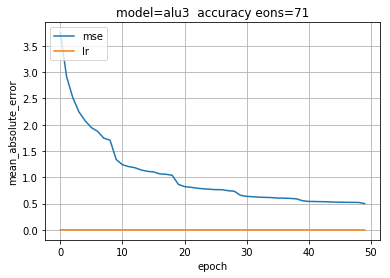

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 161 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 1.3416 - mean_absolute_error: 1.3416
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 1.3366 - mean_absolute_error: 1.3366
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 1.2845 - mean_absolute_error: 1.2845
Epoch 4/50
26000/26000 [==============================] - 3s 110us/step - loss: 1.2817 - mean_absolute_error: 1.2817
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 1.2413 - mean_absolute_error: 1.2413
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 1.2264 - mean_absolute_error: 1.2264
Epoch 7/50
26000/26000 [==============================] - 3s 111us/step - loss: 1.2462 - mean_absolute_error: 1.2462
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 72


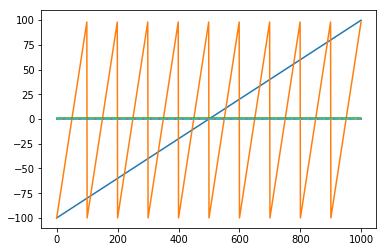

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 72


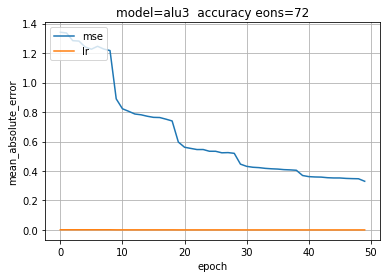

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 162 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 1.0635 - mean_absolute_error: 1.0635
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 1.1041 - mean_absolute_error: 1.1041
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 1.0883 - mean_absolute_error: 1.0883
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 1.1036 - mean_absolute_error: 1.1036
Epoch 5/50
26000/26000 [==============================] - 3s 118us/step - loss: 1.0759 - mean_absolute_error: 1.0759
Epoch 6/50
26000/26000 [==============================] - 3s 116us/step - loss: 1.0652 - mean_absolute_error: 1.0652
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 1.0805 - mean_absolute_error: 1.0805
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 73


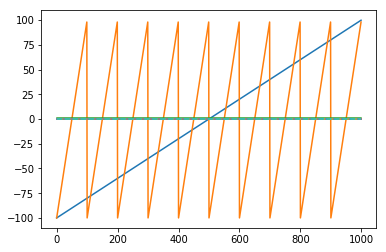

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 73


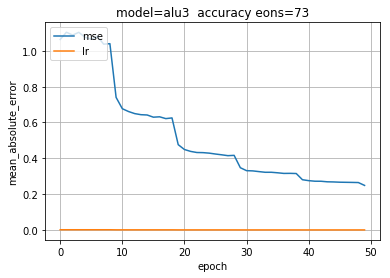

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 163 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 112us/step - loss: 0.9719 - mean_absolute_error: 0.9719
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 1.0037 - mean_absolute_error: 1.0037
Epoch 3/50
26000/26000 [==============================] - 3s 115us/step - loss: 1.0050 - mean_absolute_error: 1.0050
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.9693 - mean_absolute_error: 0.9693
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.9371 - mean_absolute_error: 0.9371
Epoch 6/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.9639 - mean_absolute_error: 0.9639
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.9642 - mean_absolute_error: 0.9642
Epoch 8/50
26000/26000 [==============================] - 3s 110us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 74


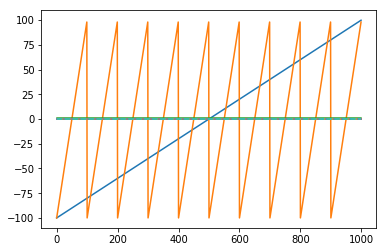

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 74


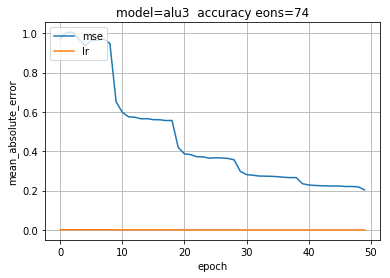

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 164 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 112us/step - loss: 0.8960 - mean_absolute_error: 0.8960
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.9195 - mean_absolute_error: 0.9195
Epoch 3/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.9262 - mean_absolute_error: 0.9262
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.8973 - mean_absolute_error: 0.8973
Epoch 5/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.8920 - mean_absolute_error: 0.8920
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.9074 - mean_absolute_error: 0.9074
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.8918 - mean_absolute_error: 0.8918
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 75


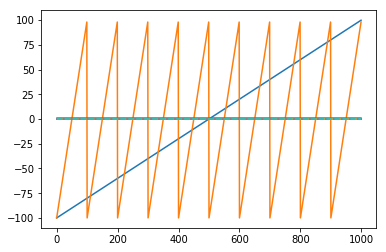

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 75


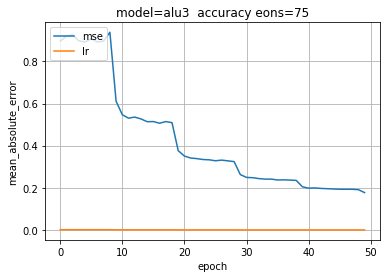

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 165 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 111us/step - loss: 0.8378 - mean_absolute_error: 0.8378
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.8594 - mean_absolute_error: 0.8594
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.8707 - mean_absolute_error: 0.8707
Epoch 4/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.8381 - mean_absolute_error: 0.8381
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.8490 - mean_absolute_error: 0.8490
Epoch 6/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.8445 - mean_absolute_error: 0.8445
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.8409 - mean_absolute_error: 0.8409
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 76


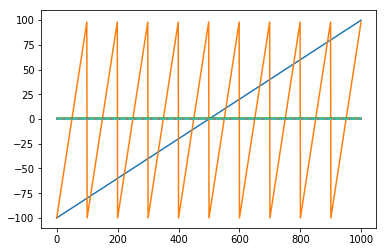

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 76


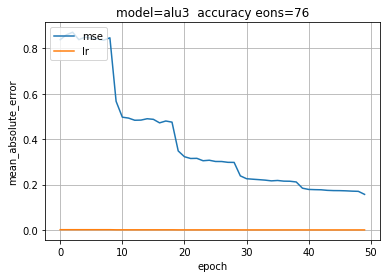

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 166 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 0.7769 - mean_absolute_error: 0.7769
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.8098 - mean_absolute_error: 0.8098
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.8332 - mean_absolute_error: 0.8332
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.7941 - mean_absolute_error: 0.7941
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.8028 - mean_absolute_error: 0.8028
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.7959 - mean_absolute_error: 0.7959
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.8214 - mean_absolute_error: 0.8214
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 77


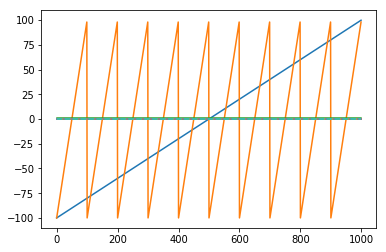

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 77


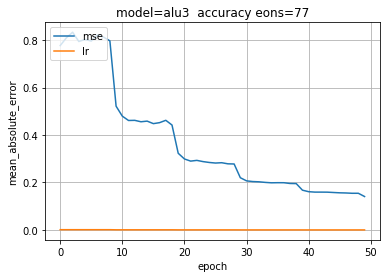

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 167 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 119us/step - loss: 0.7582 - mean_absolute_error: 0.7582
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.7841 - mean_absolute_error: 0.7841
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.7866 - mean_absolute_error: 0.7866
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.7757 - mean_absolute_error: 0.7757
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.7896 - mean_absolute_error: 0.7896
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.7762 - mean_absolute_error: 0.7762
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.7803 - mean_absolute_error: 0.7803
Epoch 8/50
26000/26000 [==============================] - 3s 116us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 78


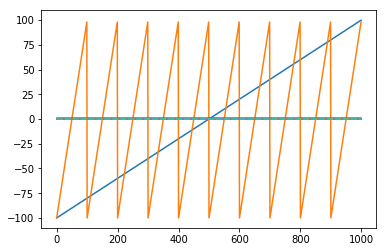

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 78


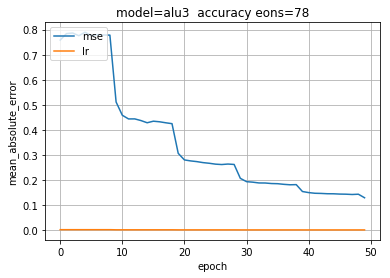

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 168 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 0.7379 - mean_absolute_error: 0.7379
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.7564 - mean_absolute_error: 0.7564
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.7472 - mean_absolute_error: 0.7472
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.7245 - mean_absolute_error: 0.7245
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.7351 - mean_absolute_error: 0.7351
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.7387 - mean_absolute_error: 0.7387
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.7329 - mean_absolute_error: 0.7329
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 79


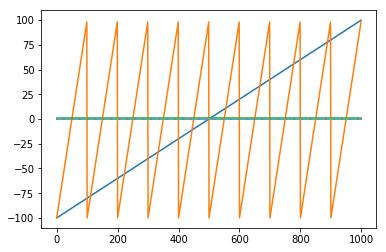

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 79


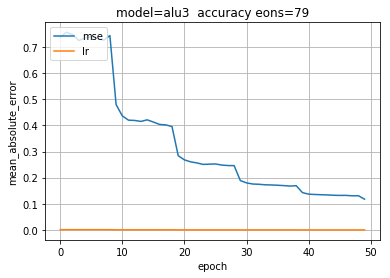

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 169 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 0.6963 - mean_absolute_error: 0.6963
Epoch 2/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.7344 - mean_absolute_error: 0.7344
Epoch 3/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.7425 - mean_absolute_error: 0.7425
Epoch 4/50
26000/26000 [==============================] - 3s 120us/step - loss: 0.7180 - mean_absolute_error: 0.7180
Epoch 5/50
26000/26000 [==============================] - 3s 120us/step - loss: 0.7241 - mean_absolute_error: 0.7241
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.7038 - mean_absolute_error: 0.7038
Epoch 7/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.7208 - mean_absolute_error: 0.7208
Epoch 8/50
26000/26000 [==============================] - 3s 112us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 80


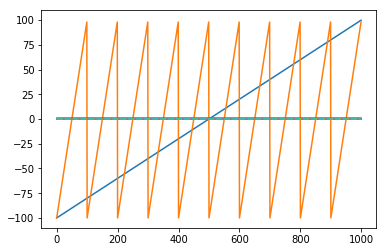

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 80


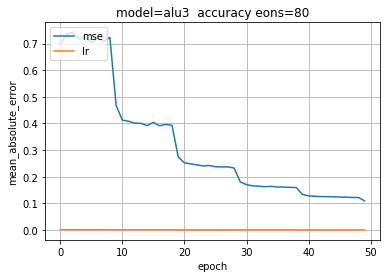

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 170 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 0.6780 - mean_absolute_error: 0.6780
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.7245 - mean_absolute_error: 0.7245
Epoch 3/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.6879 - mean_absolute_error: 0.6879
Epoch 4/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.6931 - mean_absolute_error: 0.6931
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.6947 - mean_absolute_error: 0.6947
Epoch 6/50
26000/26000 [==============================] - 3s 118us/step - loss: 0.6715 - mean_absolute_error: 0.6715
Epoch 7/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.6850 - mean_absolute_error: 0.6850
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 81


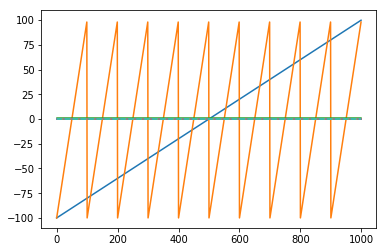

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 81


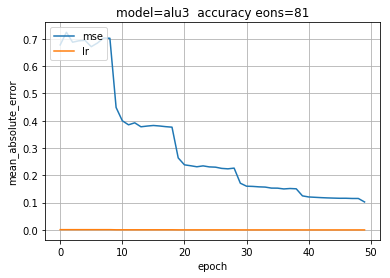

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 171 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 0.6480 - mean_absolute_error: 0.6480
Epoch 2/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.6726 - mean_absolute_error: 0.6726
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.6707 - mean_absolute_error: 0.6707
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.6972 - mean_absolute_error: 0.6972
Epoch 5/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.6707 - mean_absolute_error: 0.6707
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.6783 - mean_absolute_error: 0.6783
Epoch 7/50
26000/26000 [==============================] - 3s 122us/step - loss: 0.6943 - mean_absolute_error: 0.6943
Epoch 8/50
26000/26000 [==============================] - 3s 117us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 82


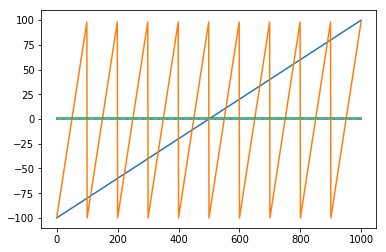

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 82


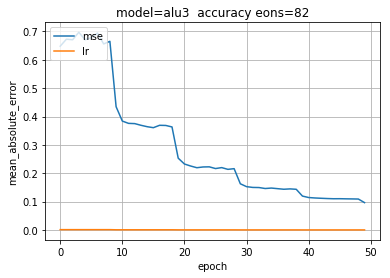

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 172 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 113us/step - loss: 0.6183 - mean_absolute_error: 0.6183
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.6607 - mean_absolute_error: 0.6607
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6446 - mean_absolute_error: 0.6446
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.6582 - mean_absolute_error: 0.6582
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.6682 - mean_absolute_error: 0.6682
Epoch 6/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.6428 - mean_absolute_error: 0.6428
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.6549 - mean_absolute_error: 0.6549
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 83


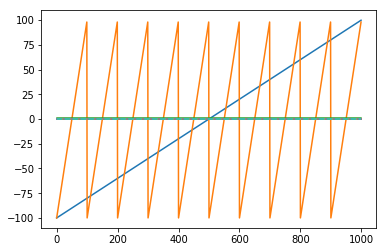

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 83


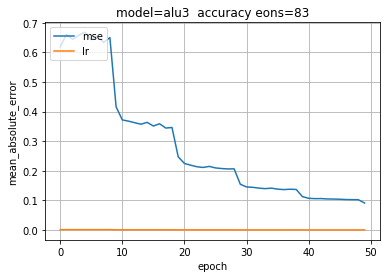

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 173 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 0.6053 - mean_absolute_error: 0.6053
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6528 - mean_absolute_error: 0.6528
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6339 - mean_absolute_error: 0.6339
Epoch 4/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.6346 - mean_absolute_error: 0.6346
Epoch 5/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6299 - mean_absolute_error: 0.6299
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.6297 - mean_absolute_error: 0.6297
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.6355 - mean_absolute_error: 0.6355
Epoch 8/50
26000/26000 [==============================] - 3s 114us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 84


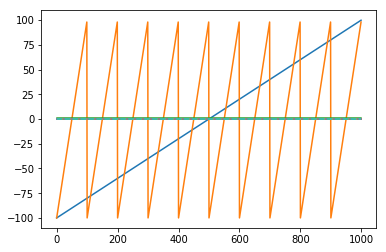

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 84


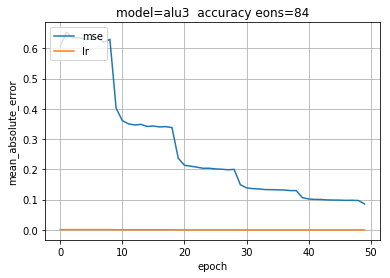

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 174 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 0.6014 - mean_absolute_error: 0.6014
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.6116 - mean_absolute_error: 0.6116
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.6291 - mean_absolute_error: 0.6291
Epoch 4/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.6142 - mean_absolute_error: 0.6142
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.6236 - mean_absolute_error: 0.6236
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.5997 - mean_absolute_error: 0.5997
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.6110 - mean_absolute_error: 0.6110
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 85


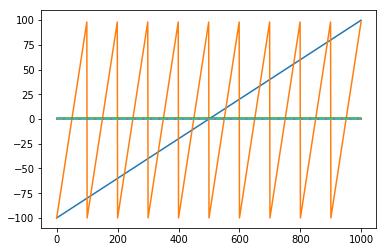

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 85


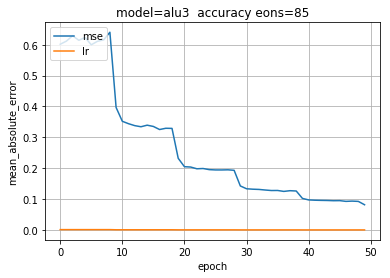

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 175 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 115us/step - loss: 0.5648 - mean_absolute_error: 0.5648
Epoch 2/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.6046 - mean_absolute_error: 0.6046
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.6056 - mean_absolute_error: 0.6056
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.5984 - mean_absolute_error: 0.5984
Epoch 5/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.5976 - mean_absolute_error: 0.5976
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6110 - mean_absolute_error: 0.6110
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.5982 - mean_absolute_error: 0.5982
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 86


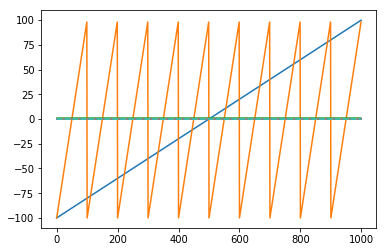

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 86


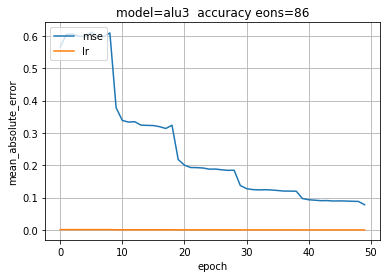

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 176 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 117us/step - loss: 0.5558 - mean_absolute_error: 0.5558
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6027 - mean_absolute_error: 0.6027
Epoch 3/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5812 - mean_absolute_error: 0.5812
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.6060 - mean_absolute_error: 0.6060
Epoch 5/50
26000/26000 [==============================] - 3s 108us/step - loss: 0.5770 - mean_absolute_error: 0.5770
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.5893 - mean_absolute_error: 0.5893
Epoch 7/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.5838 - mean_absolute_error: 0.5838
Epoch 8/50
26000/26000 [==============================] - 3s 110us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 87


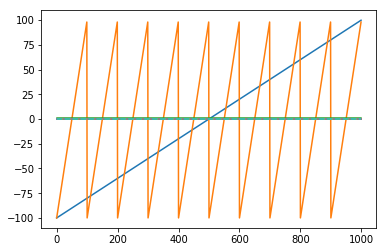

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 87


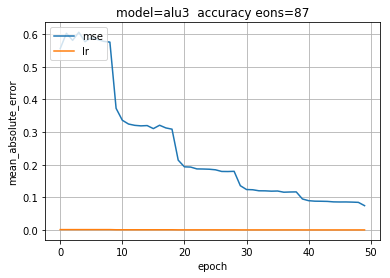

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 177 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 114us/step - loss: 0.5464 - mean_absolute_error: 0.5464
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5760 - mean_absolute_error: 0.5760
Epoch 3/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.5672 - mean_absolute_error: 0.5672
Epoch 4/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.5646 - mean_absolute_error: 0.5646
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.5714 - mean_absolute_error: 0.5714
Epoch 6/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5671 - mean_absolute_error: 0.5671
Epoch 7/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.5746 - mean_absolute_error: 0.5746
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 88


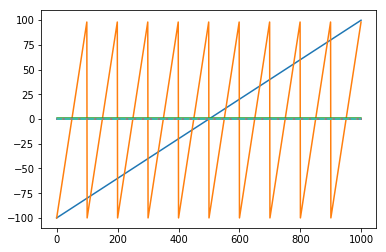

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 88


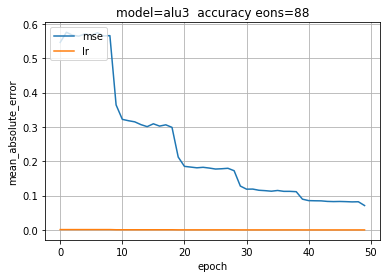

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 178 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 112us/step - loss: 0.5328 - mean_absolute_error: 0.5328
Epoch 2/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5606 - mean_absolute_error: 0.5606
Epoch 3/50
26000/26000 [==============================] - 3s 111us/step - loss: 0.5546 - mean_absolute_error: 0.5546
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5476 - mean_absolute_error: 0.5476
Epoch 5/50
26000/26000 [==============================] - 3s 114us/step - loss: 0.5608 - mean_absolute_error: 0.5608
Epoch 6/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.5589 - mean_absolute_error: 0.5589
Epoch 7/50
26000/26000 [==============================] - 3s 117us/step - loss: 0.5472 - mean_absolute_error: 0.5472
Epoch 8/50
26000/26000 [==============================] - 3s 113us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 89


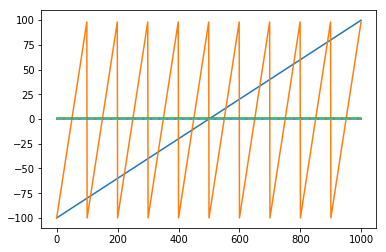

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 89


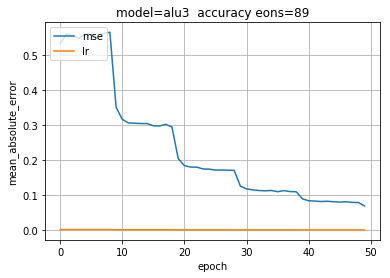

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 179 model= alu3 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 116us/step - loss: 0.5257 - mean_absolute_error: 0.5257
Epoch 2/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.5490 - mean_absolute_error: 0.5490
Epoch 3/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.5406 - mean_absolute_error: 0.5406
Epoch 4/50
26000/26000 [==============================] - 3s 113us/step - loss: 0.5548 - mean_absolute_error: 0.5548
Epoch 5/50
26000/26000 [==============================] - 3s 112us/step - loss: 0.5517 - mean_absolute_error: 0.5517
Epoch 6/50
26000/26000 [==============================] - 3s 115us/step - loss: 0.5300 - mean_absolute_error: 0.5300
Epoch 7/50
26000/26000 [==============================] - 3s 116us/step - loss: 0.5479 - mean_absolute_error: 0.5479
Epoch 8/50
26000/26000 [==============================] - 3s 115us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 90


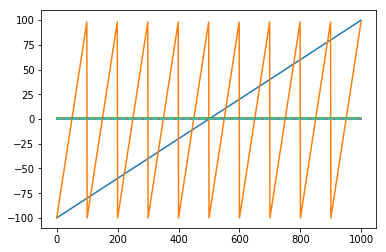

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 90


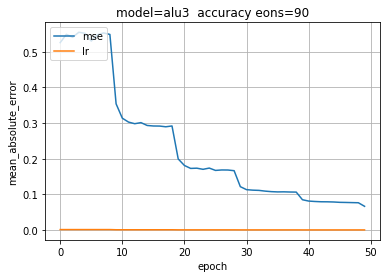

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 180 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 4.0807 - mean_absolute_error: 4.0807
Epoch 2/50
26000/26000 [==============================] - 4s 135us/step - loss: 2.9563 - mean_absolute_error: 2.9563
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 2.6157 - mean_absolute_error: 2.6157
Epoch 4/50
26000/26000 [==============================] - 3s 130us/step - loss: 2.4207 - mean_absolute_error: 2.4207
Epoch 5/50
26000/26000 [==============================] - 3s 134us/step - loss: 2.2503 - mean_absolute_error: 2.2503
Epoch 6/50
26000/26000 [==============================] - 3s 133us/step - loss: 2.1819 - mean_absolute_error: 2.1819
Epoch 7/50
26000/26000 [==============================] - 3s 134us/step - loss: 2.0705 - mean_absolute_error: 2.0705
Epoch 8/50
26000/26000 [==============================] - 3s 133us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 91


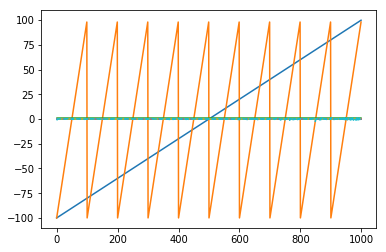

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 91


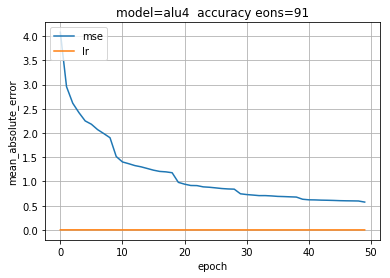

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 181 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 1.3996 - mean_absolute_error: 1.3996
Epoch 2/50
26000/26000 [==============================] - 3s 129us/step - loss: 1.4209 - mean_absolute_error: 1.4209
Epoch 3/50
26000/26000 [==============================] - 3s 129us/step - loss: 1.4159 - mean_absolute_error: 1.4159
Epoch 4/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.3934 - mean_absolute_error: 1.3934
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.4152 - mean_absolute_error: 1.4152
Epoch 6/50
26000/26000 [==============================] - 3s 132us/step - loss: 1.3684 - mean_absolute_error: 1.3684
Epoch 7/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.3446 - mean_absolute_error: 1.3446
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 92


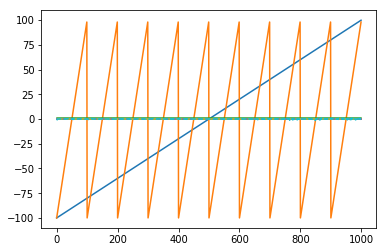

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 92


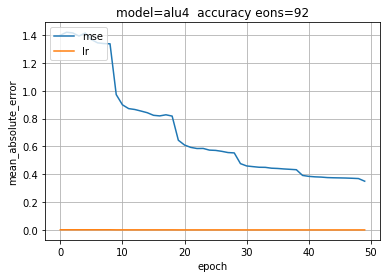

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 182 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 1.1257 - mean_absolute_error: 1.1257
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.2107 - mean_absolute_error: 1.2107
Epoch 3/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.1979 - mean_absolute_error: 1.1979
Epoch 4/50
26000/26000 [==============================] - 3s 128us/step - loss: 1.1780 - mean_absolute_error: 1.1780
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.1697 - mean_absolute_error: 1.1697
Epoch 6/50
26000/26000 [==============================] - 3s 126us/step - loss: 1.1706 - mean_absolute_error: 1.1706
Epoch 7/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.1747 - mean_absolute_error: 1.1747
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 93


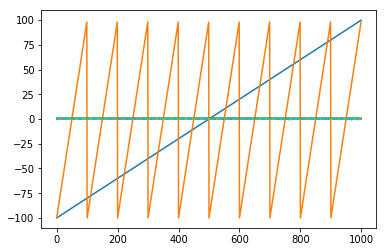

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 93


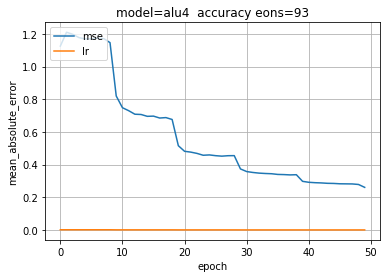

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 183 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 128us/step - loss: 1.0452 - mean_absolute_error: 1.0452
Epoch 2/50
26000/26000 [==============================] - 3s 129us/step - loss: 1.0842 - mean_absolute_error: 1.0842
Epoch 3/50
26000/26000 [==============================] - 3s 129us/step - loss: 1.0797 - mean_absolute_error: 1.0797
Epoch 4/50
26000/26000 [==============================] - 3s 134us/step - loss: 1.0898 - mean_absolute_error: 1.0898
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.0994 - mean_absolute_error: 1.0994
Epoch 6/50
26000/26000 [==============================] - 4s 143us/step - loss: 1.0613 - mean_absolute_error: 1.0613
Epoch 7/50
26000/26000 [==============================] - 4s 136us/step - loss: 1.0431 - mean_absolute_error: 1.0431
Epoch 8/50
26000/26000 [==============================] - 4s 140us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 94


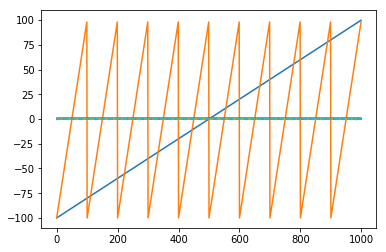

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 94


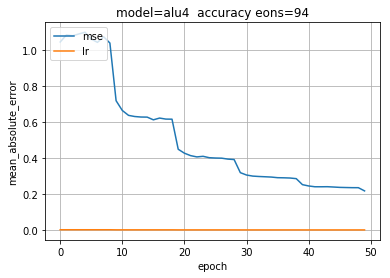

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 184 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 129us/step - loss: 0.9763 - mean_absolute_error: 0.9763
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.0074 - mean_absolute_error: 1.0074
Epoch 3/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.0044 - mean_absolute_error: 1.0044
Epoch 4/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.0074 - mean_absolute_error: 1.0074
Epoch 5/50
26000/26000 [==============================] - 3s 129us/step - loss: 0.9993 - mean_absolute_error: 0.9993
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 1.0161 - mean_absolute_error: 1.0161
Epoch 7/50
26000/26000 [==============================] - 3s 130us/step - loss: 1.0013 - mean_absolute_error: 1.0013
Epoch 8/50
26000/26000 [==============================] - 3s 131us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 95


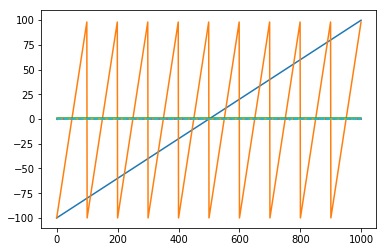

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 95


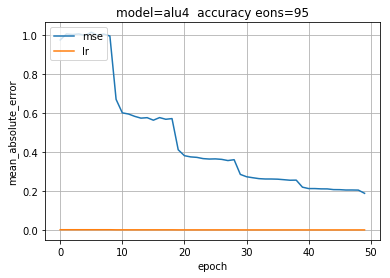

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 185 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 4s 135us/step - loss: 0.8955 - mean_absolute_error: 0.8955
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.9497 - mean_absolute_error: 0.9497
Epoch 3/50
26000/26000 [==============================] - 3s 129us/step - loss: 0.9477 - mean_absolute_error: 0.9477
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.9578 - mean_absolute_error: 0.9578
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.9504 - mean_absolute_error: 0.9504
Epoch 6/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.9410 - mean_absolute_error: 0.9410
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.9564 - mean_absolute_error: 0.9564
Epoch 8/50
26000/26000 [==============================] - 3s 134us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 96


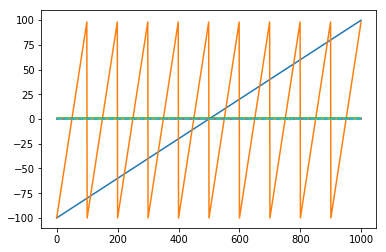

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 96


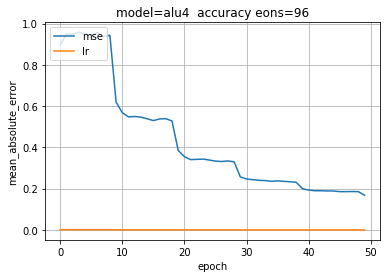

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 186 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 0.8645 - mean_absolute_error: 0.8645
Epoch 2/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.9138 - mean_absolute_error: 0.9138
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.9116 - mean_absolute_error: 0.9116
Epoch 4/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.9119 - mean_absolute_error: 0.9119
Epoch 5/50
26000/26000 [==============================] - 3s 134us/step - loss: 0.9057 - mean_absolute_error: 0.9057
Epoch 6/50
26000/26000 [==============================] - 4s 138us/step - loss: 0.9011 - mean_absolute_error: 0.9011
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8980 - mean_absolute_error: 0.8980
Epoch 8/50
26000/26000 [==============================] - 4s 136us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 97


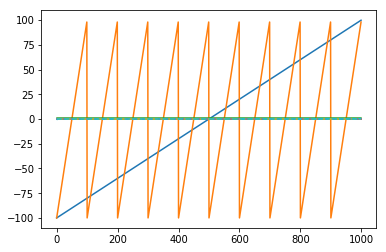

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 97


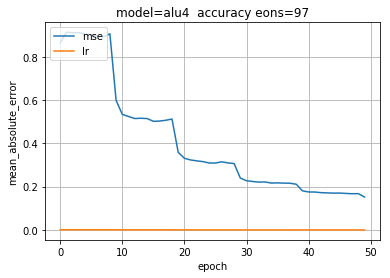

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 187 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 0.8408 - mean_absolute_error: 0.8408
Epoch 2/50
26000/26000 [==============================] - 4s 137us/step - loss: 0.8670 - mean_absolute_error: 0.8670
Epoch 3/50
26000/26000 [==============================] - 4s 137us/step - loss: 0.8711 - mean_absolute_error: 0.8711
Epoch 4/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8624 - mean_absolute_error: 0.8624
Epoch 5/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.8947 - mean_absolute_error: 0.8947
Epoch 6/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.8691 - mean_absolute_error: 0.8691
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8609 - mean_absolute_error: 0.8609
Epoch 8/50
26000/26000 [==============================] - 3s 130us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 98


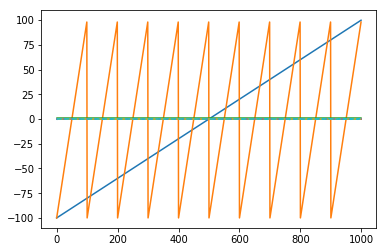

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 98


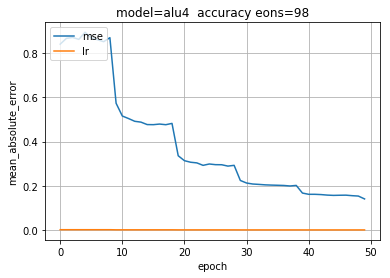

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 188 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 0.7928 - mean_absolute_error: 0.7928
Epoch 2/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8474 - mean_absolute_error: 0.8474
Epoch 3/50
26000/26000 [==============================] - 3s 128us/step - loss: 0.8471 - mean_absolute_error: 0.8471
Epoch 4/50
26000/26000 [==============================] - 3s 128us/step - loss: 0.8207 - mean_absolute_error: 0.8207
Epoch 5/50
26000/26000 [==============================] - 3s 129us/step - loss: 0.8332 - mean_absolute_error: 0.8332
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.8467 - mean_absolute_error: 0.8467
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.8397 - mean_absolute_error: 0.8397
Epoch 8/50
26000/26000 [==============================] - 3s 129us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 99


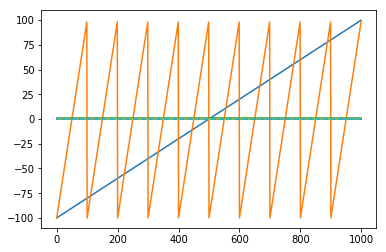

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 99


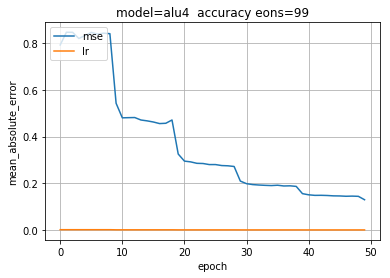

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 189 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 134us/step - loss: 0.7639 - mean_absolute_error: 0.7639
Epoch 2/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8240 - mean_absolute_error: 0.8240
Epoch 3/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.8248 - mean_absolute_error: 0.8248
Epoch 4/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.7972 - mean_absolute_error: 0.7972
Epoch 5/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8029 - mean_absolute_error: 0.8029
Epoch 6/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.8159 - mean_absolute_error: 0.8159
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.8027 - mean_absolute_error: 0.8027
Epoch 8/50
26000/26000 [==============================] - 3s 134us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 100


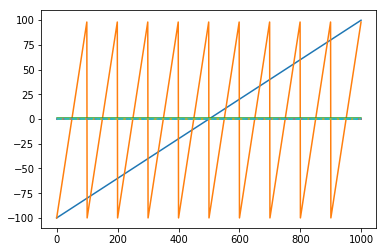

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 100


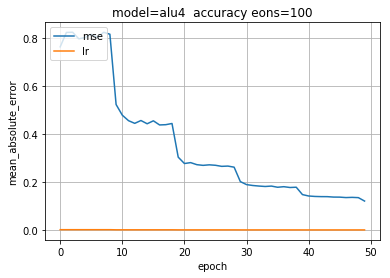

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 190 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 0.7692 - mean_absolute_error: 0.7692
Epoch 2/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.7767 - mean_absolute_error: 0.7767
Epoch 3/50
26000/26000 [==============================] - 3s 134us/step - loss: 0.7795 - mean_absolute_error: 0.7795
Epoch 4/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.7827 - mean_absolute_error: 0.7827
Epoch 5/50
26000/26000 [==============================] - 4s 136us/step - loss: 0.7891 - mean_absolute_error: 0.7891
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7818 - mean_absolute_error: 0.7818
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.7717 - mean_absolute_error: 0.7717
Epoch 8/50
26000/26000 [==============================] - 3s 129us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 101


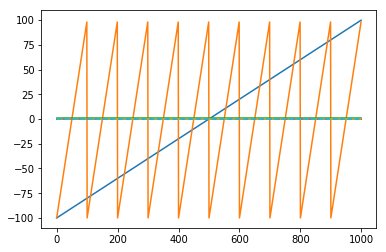

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 101


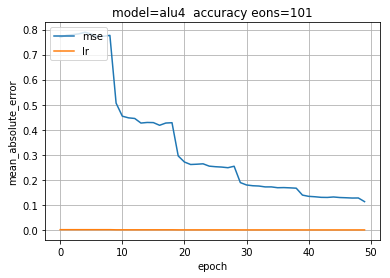

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 191 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 0.7402 - mean_absolute_error: 0.7402
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7650 - mean_absolute_error: 0.7650
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.7734 - mean_absolute_error: 0.7734
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7435 - mean_absolute_error: 0.7435
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.7642 - mean_absolute_error: 0.7642
Epoch 6/50
26000/26000 [==============================] - 3s 128us/step - loss: 0.7666 - mean_absolute_error: 0.7666
Epoch 7/50
26000/26000 [==============================] - 3s 134us/step - loss: 0.7585 - mean_absolute_error: 0.7585
Epoch 8/50
26000/26000 [==============================] - 3s 130us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 102


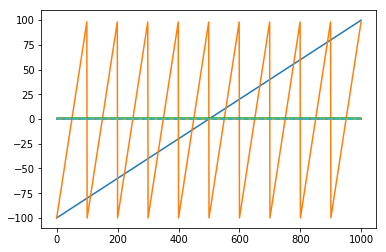

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 102


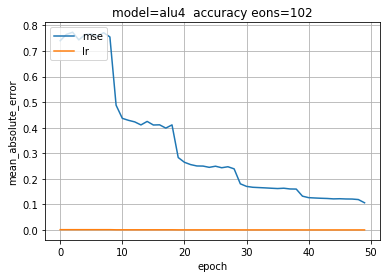

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 192 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 0.7022 - mean_absolute_error: 0.7022
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7357 - mean_absolute_error: 0.7357
Epoch 3/50
26000/26000 [==============================] - 4s 138us/step - loss: 0.7462 - mean_absolute_error: 0.7462
Epoch 4/50
26000/26000 [==============================] - 4s 138us/step - loss: 0.7275 - mean_absolute_error: 0.7275
Epoch 5/50
26000/26000 [==============================] - 4s 139us/step - loss: 0.7497 - mean_absolute_error: 0.7497
Epoch 6/50
26000/26000 [==============================] - 4s 140us/step - loss: 0.7320 - mean_absolute_error: 0.7320
Epoch 7/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.7398 - mean_absolute_error: 0.7398
Epoch 8/50
26000/26000 [==============================] - 4s 137us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 103


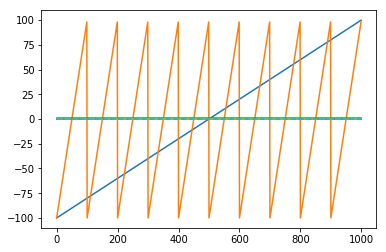

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 103


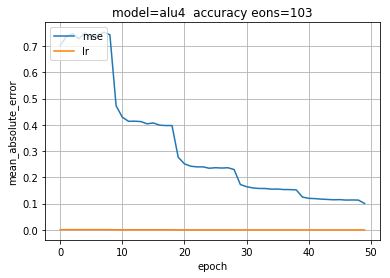

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 193 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 0.6808 - mean_absolute_error: 0.6808
Epoch 2/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.7215 - mean_absolute_error: 0.7215
Epoch 3/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.7320 - mean_absolute_error: 0.7320
Epoch 4/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.7220 - mean_absolute_error: 0.7220
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7168 - mean_absolute_error: 0.7168
Epoch 6/50
26000/26000 [==============================] - 3s 129us/step - loss: 0.7090 - mean_absolute_error: 0.7090
Epoch 7/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.7108 - mean_absolute_error: 0.7108
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 104


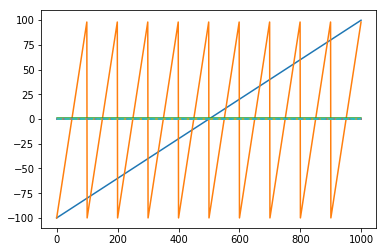

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 104


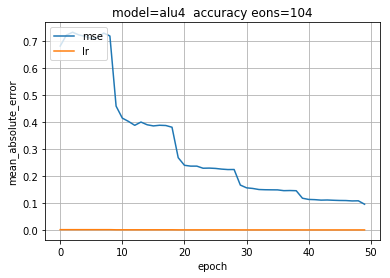

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 194 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 0.6614 - mean_absolute_error: 0.6614
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6999 - mean_absolute_error: 0.6999
Epoch 3/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.7018 - mean_absolute_error: 0.7018
Epoch 4/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.7000 - mean_absolute_error: 0.7000
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6920 - mean_absolute_error: 0.6920
Epoch 6/50
26000/26000 [==============================] - 3s 127us/step - loss: 0.6944 - mean_absolute_error: 0.6944
Epoch 7/50
26000/26000 [==============================] - 3s 129us/step - loss: 0.6950 - mean_absolute_error: 0.6950
Epoch 8/50
26000/26000 [==============================] - 3s 133us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 105


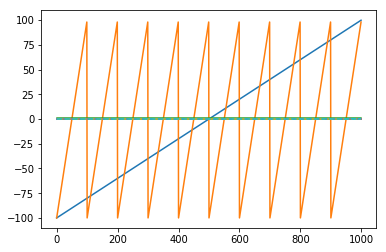

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 105


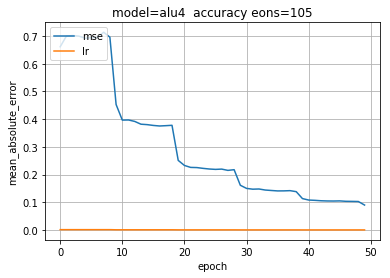

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 195 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 130us/step - loss: 0.6298 - mean_absolute_error: 0.6298
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6750 - mean_absolute_error: 0.6750
Epoch 3/50
26000/26000 [==============================] - 4s 137us/step - loss: 0.6581 - mean_absolute_error: 0.6581
Epoch 4/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.6780 - mean_absolute_error: 0.6780
Epoch 5/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.6981 - mean_absolute_error: 0.6981
Epoch 6/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6671 - mean_absolute_error: 0.6671
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.6783 - mean_absolute_error: 0.6783
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 106


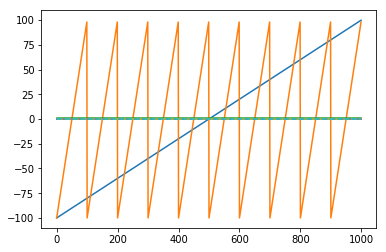

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 106


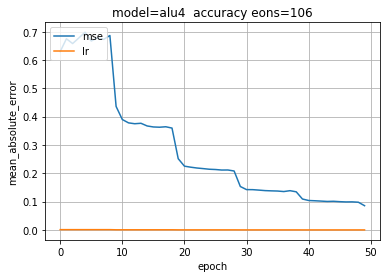

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 196 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 133us/step - loss: 0.6387 - mean_absolute_error: 0.6387
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6610 - mean_absolute_error: 0.6610
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6584 - mean_absolute_error: 0.6584
Epoch 4/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6632 - mean_absolute_error: 0.6632
Epoch 5/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.6565 - mean_absolute_error: 0.6565
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6800 - mean_absolute_error: 0.6800
Epoch 7/50
26000/26000 [==============================] - 3s 134us/step - loss: 0.6680 - mean_absolute_error: 0.6680
Epoch 8/50
26000/26000 [==============================] - 4s 136us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 107


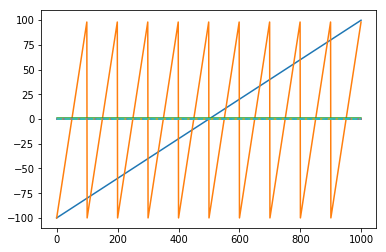

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 107


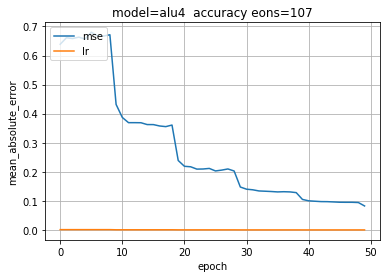

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 197 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 131us/step - loss: 0.6077 - mean_absolute_error: 0.6077
Epoch 2/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.6383 - mean_absolute_error: 0.6383
Epoch 3/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6523 - mean_absolute_error: 0.6523
Epoch 4/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6574 - mean_absolute_error: 0.6574
Epoch 5/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6537 - mean_absolute_error: 0.6537
Epoch 6/50
26000/26000 [==============================] - 4s 137us/step - loss: 0.6502 - mean_absolute_error: 0.6502
Epoch 7/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.6420 - mean_absolute_error: 0.6420
Epoch 8/50
26000/26000 [==============================] - 3s 133us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 108


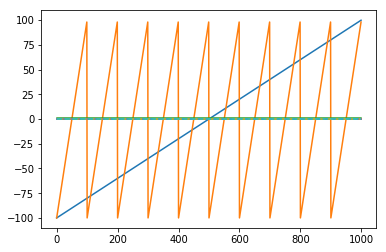

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 108


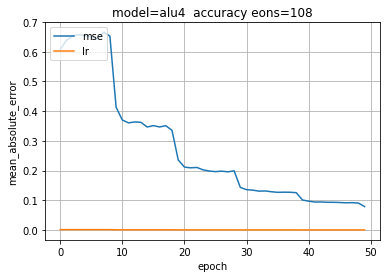

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 198 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 130us/step - loss: 0.5938 - mean_absolute_error: 0.5938
Epoch 2/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6477 - mean_absolute_error: 0.6477
Epoch 3/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6472 - mean_absolute_error: 0.6472
Epoch 4/50
26000/26000 [==============================] - 3s 127us/step - loss: 0.6298 - mean_absolute_error: 0.6298
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6379 - mean_absolute_error: 0.6379
Epoch 6/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.6422 - mean_absolute_error: 0.6422
Epoch 7/50
26000/26000 [==============================] - 4s 135us/step - loss: 0.6241 - mean_absolute_error: 0.6241
Epoch 8/50
26000/26000 [==============================] - 3s 132us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 109


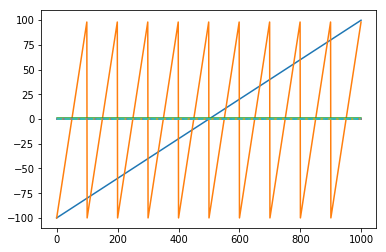

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 109


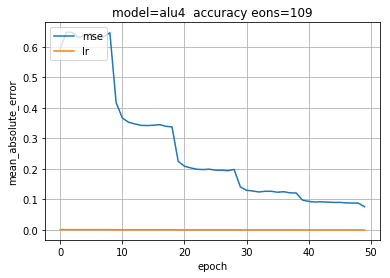

<IPython.core.display.Javascript object>

yp= (26000,) xp= (26000, 228) pindex (26000,)
eon= 199 model= alu4 inp= cat
Epoch 1/50
Epoch: 0 Learning Rate= 0.001
26000/26000 [==============================] - 3s 132us/step - loss: 0.5890 - mean_absolute_error: 0.5890
Epoch 2/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6398 - mean_absolute_error: 0.6398
Epoch 3/50
26000/26000 [==============================] - 3s 130us/step - loss: 0.6183 - mean_absolute_error: 0.6183
Epoch 4/50
26000/26000 [==============================] - 4s 137us/step - loss: 0.6317 - mean_absolute_error: 0.6317
Epoch 5/50
26000/26000 [==============================] - 3s 133us/step - loss: 0.6307 - mean_absolute_error: 0.6307
Epoch 6/50
26000/26000 [==============================] - 3s 131us/step - loss: 0.6183 - mean_absolute_error: 0.6183
Epoch 7/50
26000/26000 [==============================] - 3s 132us/step - loss: 0.6224 - mean_absolute_error: 0.6224
Epoch 8/50
26000/26000 [==============================] - 3s 130us/step - l

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

op= cst0 eons= 110


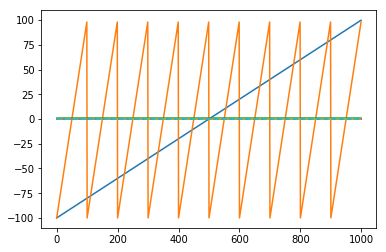

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


   o:  cst0,  sign,  sela,  selb,   add,   sub,  mult,   div,   mod,   max,   min,   abs,   log,   exp,   sin,   cos,  tanh,   xor,  shft,   and,    or,  popc,  inta,  intb,  bit0,  bitx,
   a: 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80, 99.80,
   b: 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00, 98.00,

   y:  0.00, 100.00, 99.80, 98.00, 197.80,  1.80, 97.80,  1.02,  1.80, 99.80, 98.00, 99.80, 200.00, 135.64, -1.57, 99.99, 100.00,  1.00, 792.00, 98.00, 99.00, 32.00, 99.00, 98.00, 100.00,  0.00,
  yo:  0.18, 100.18, 99.71, 97.98, 197.86,  1.89, 97.48,  1.30,  2.09, 100.00, 98.14, 99.80, 200.14, 135.52, -1.35, 100.10, 100.17,  1.12, 792.22, 98.06, 98.94, 32.22, 99.08, 98.01, 100.00,  0.12,
 err:  0.18,  0.18, -0.09, -0.02,  0.06,  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

eons= 110


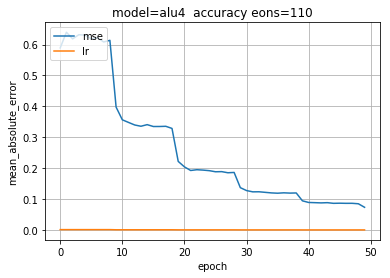

<IPython.core.display.Javascript object>

In [29]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

from matplotlib import cbook
from matplotlib import cm
from matplotlib.colors import LightSource
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import



from matplotlib import pylab
from google.colab import widgets
grid = widgets.Grid(4, 1)

lrate = LearningRateScheduler(step_decay)
callbacks_list = [lrate]

#reshape x and y for training
xx=np.reshape(x,(nsamp,28))
yy=np.reshape(y,(nsamp))
xx0=np.zeros((26000,228))

#print some diags
print('model=',model)
print(x.shape, y.shape)
print(xx.shape, yy.shape)
print(xx0.shape, xx.shape, xcat0.shape,xcat1.shape)
print("eons=",eons)


 
# schedule models and inputs  
for eon in range(200,300) :
  

  if(eon>= 0) : model='alu0'; inp='bin'; 
  if(eon>=10) : model='alu1'; inp='bin';
  if(eon>=20) : model='alu2'; inp='bin';
  if(eon>=30) : model='alu3'; inp='bin';
  if(eon>=40) : model='alu4'; inp='bin';
  
  if(eon>=50) : model='alu0'; inp='cat';
  if(eon>=60) : model='alu1'; inp='cat';
  if(eon>=70) : model='alu2'; inp='cat';
  if(eon>=80) : model='alu3'; inp='cat';
  if(eon>=90) : model='alu4'; inp='cat';

  if(eon>=100) : model='alu1'; inp='bin';
  if(eon>=120) : model='alu3'; inp='bin';
  if(eon>=140) : model='alu4'; inp='bin';
  if(eon>=160) : model='alu3'; inp='cat';
  if(eon>=180) : model='alu4'; inp='cat';
  if(eon>=200) : model='alu3'; inp='cat';
  if(eon>=250) : model='alu4'; inp='cat';
 

  #select the various inputs 
  if inp=='bin' :
    xcat0= np.zeros((nsamp,100))
    xcat1= np.zeros((nsamp,100))
  if inp=='cat' : 
    xcat0= to_categorical(x[:,0,0],100)
    xcat1= to_categorical(x[:,0,1],100)
  
  xx0=np.concatenate([xx,xcat0,xcat1],axis=1)  
  
  # shuffle the data for fitting
  pindex=np.random.permutation(26000)
  print('yp=',yp.shape,'xp=',xp.shape, 'pindex',pindex.shape)
  
  yp=yy[pindex]
  xp=xx0[pindex,:]

  print('eon=',eon,'model=',model, 'inp=',inp)

  #select model to fit
  if(model=='alu0') : hist=alu0_model.fit(xp, yp, validation_split=0.0, epochs=50, batch_size=32, callbacks=[lrate], verbose=1, shuffle=True)
  if(model=='alu1') : hist=alu1_model.fit(xp, yp, validation_split=0.0, epochs=50, batch_size=32, callbacks=[lrate], verbose=1, shuffle=True)
  if(model=='alu2') : hist=alu2_model.fit(xp, yp, validation_split=0.0, epochs=50, batch_size=32, callbacks=[lrate], verbose=1, shuffle=True)
  if(model=='alu3') : hist=alu3_model.fit(xp, yp, validation_split=0.0, epochs=50, batch_size=32, callbacks=[lrate], verbose=1, shuffle=True)
  if(model=='alu4') : hist=alu4_model.fit(xp, yp, validation_split=0.0, epochs=50, batch_size=32, callbacks=[lrate], verbose=1, shuffle=True)
 
  print(model)

  #evaluate the model 
  if(model=='alu0') : yo=alu0_model.predict(xx0, verbose=1)
  if(model=='alu1') : yo=alu1_model.predict(xx0, verbose=1)
  if(model=='alu2') : yo=alu2_model.predict(xx0, verbose=1)
  if(model=='alu3') : yo=alu3_model.predict(xx0, verbose=1)
  if(model=='alu4') : yo=alu4_model.predict(xx0, verbose=1)
 
  #store the results to yhist
  eons=eons+1;
  yhist[eons,:]=yo[:,0]
  ymodel[eons]=model

  #plot the first opcode data and results
  with grid.output_to(0, 0):
    print('op=',opcodes[0], 'eons=',str(eons))
    plt.plot(x [0:1000,0],'-')
    plt.plot(y [0:1000], '--')
    plt.plot(yo[0:1000], '--')
    plt.show()
  
  #print test examples from each opcode 
  with grid.output_to(3, 0):
    grid.clear_cell()
    printf('\n   o:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5s,', op[i] )
    
    printf('\n   a:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', xx[i,0])
    
    printf('\n   b:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', xx[i,1])
    
    print()
    printf('\n   y:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', y[i])
    
    printf('\n  yo:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', yo[i])
    
    printf('\n err:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', yo[i]- y[i])
    
    printf('\nperr:')
    for i in range(999,nsamp,int(nsamp/26)) :
      printf(' %5.2f,', (yo[i]- y[i]) / max(.001,y[i]))
      
    print('\n')
    
    print(hist.history.keys())
    print(hist.history['mean_absolute_error'])
 
  #plot the accuracy and learning rate
  with grid.output_to(1, 0):
    print('eons=',eons)

    # summarize history for accuracy
    plt.plot(hist.history['mean_absolute_error'])
    #plt.plot(hist.history['mean_squared_error'])
    #plt.plot(hist.history['val_mean_squared_error'])
    plt.plot(hist.history['lr'])
    plt.title('model='+ ymodel[eons]+'  accuracy eons='+ str(eons))
    plt.ylabel('mean_absolute_error')
    plt.xlabel('epoch')
    plt.legend(['mse', 'lr'], loc='upper left')
    plt.grid(True)
    plt.show()

#some results
#-------------------------
#alu0 cat e=10 err10=  5.0 
#alu1 cat e=10 err10=  0.5 
#alu2 cat e=10 err10=  3.0 
#alu3 cat e=10 err10=  0.2 err30=0.08 
#alu4 cat e=10 err10=  0.25  err30=0.08 
#alu0 bin e=10 err10= 10.5 
#alu1 bin e=10 err10=  4.5 err30=3.2
#alu2 bin e=10 err10=  9.0 
#alu3 bin e=10 err10=  3.8 err30=2.3
#alu4 bin e=10 err10=  3.0 err30=1.8


##Make a set of charts for the opcodes

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

26000/26000 [==============================] - 1s 31us/step


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


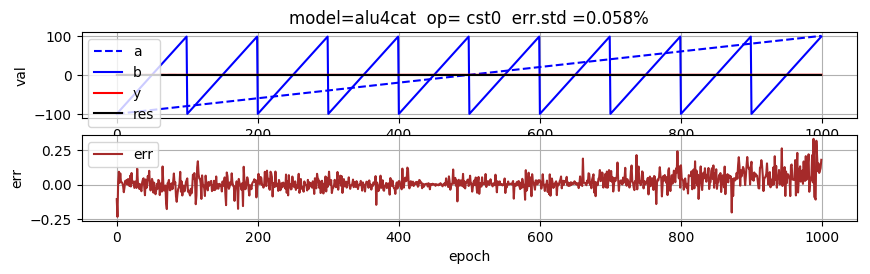

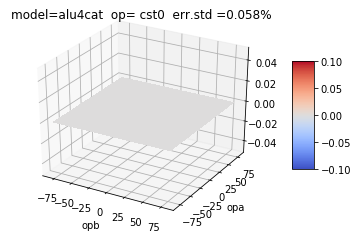

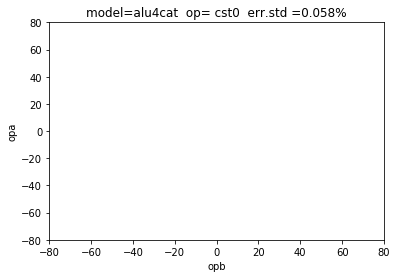

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

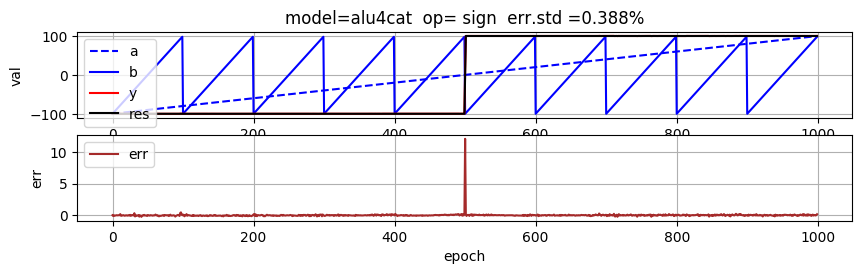

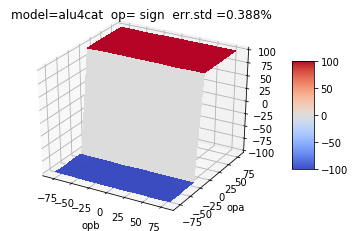

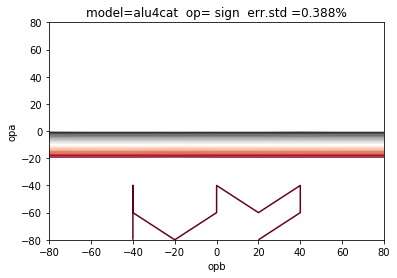

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

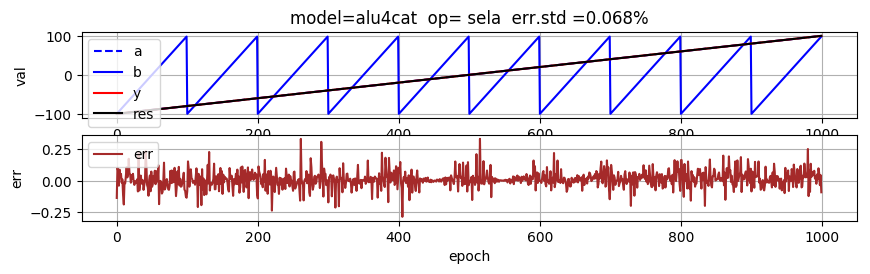

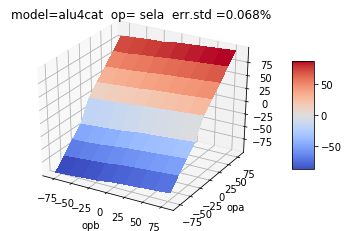

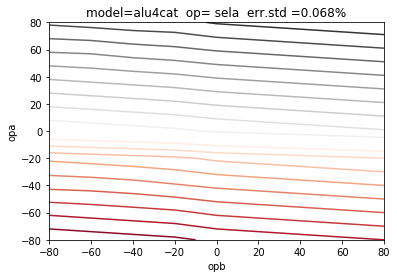

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

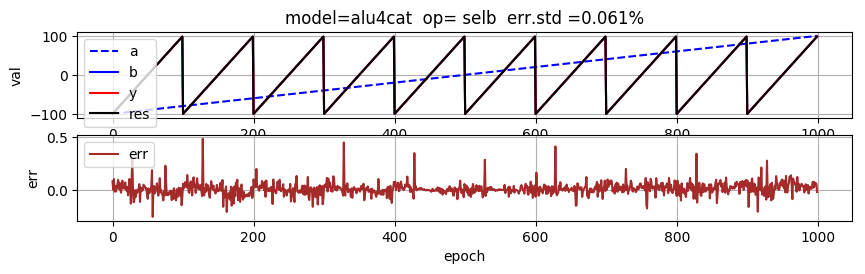

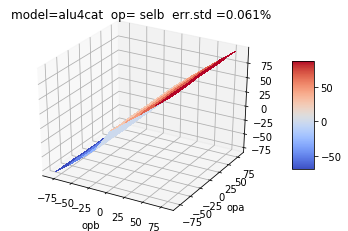

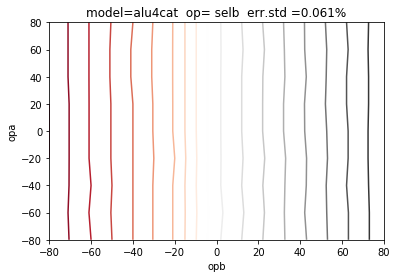

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

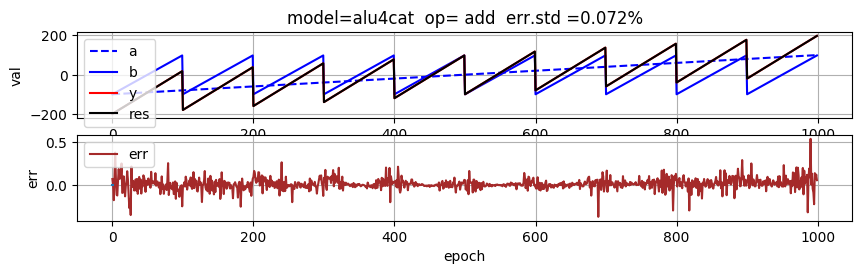

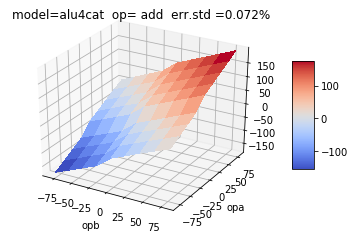

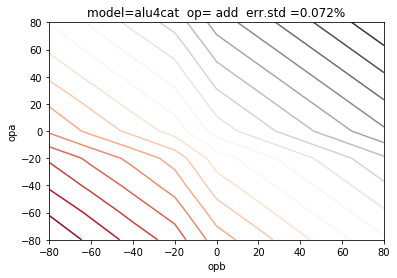

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

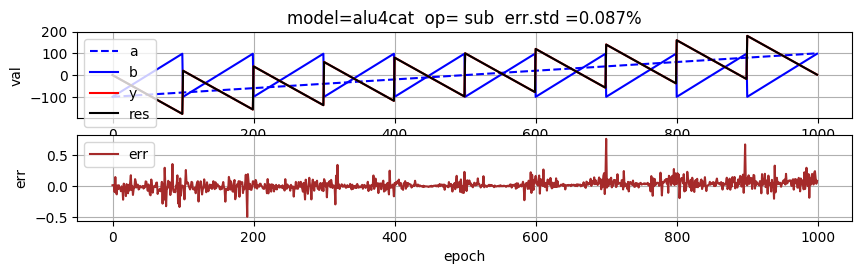

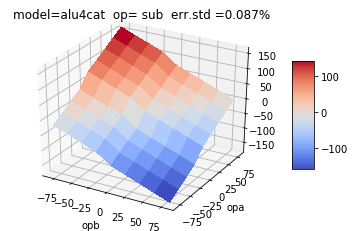

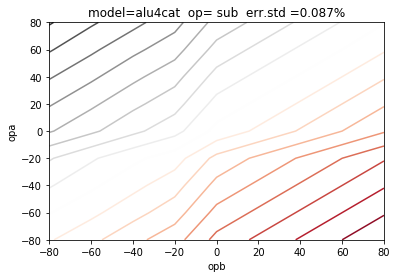

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

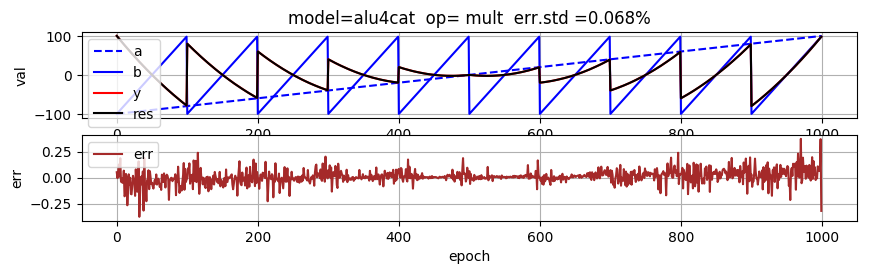

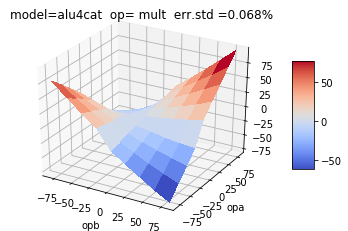

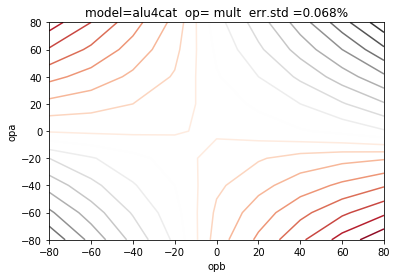

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

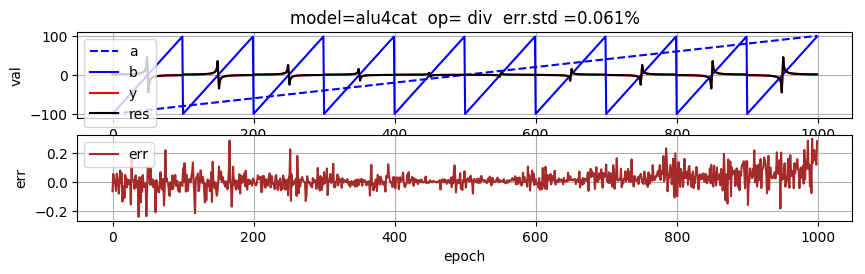

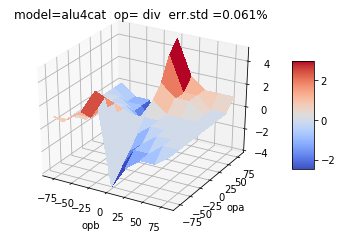

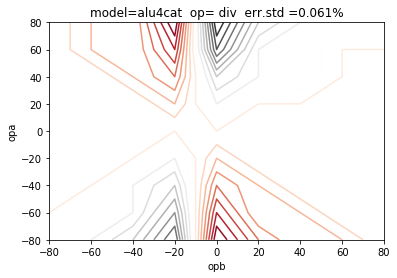

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

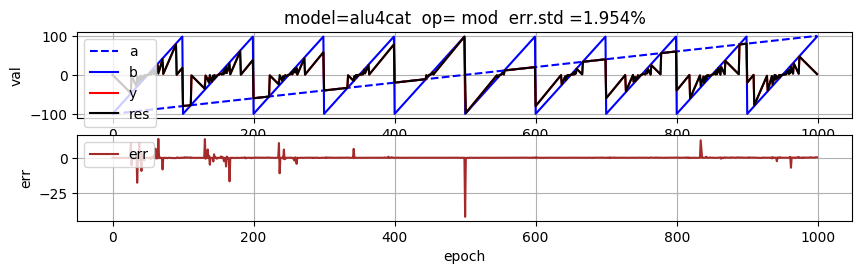

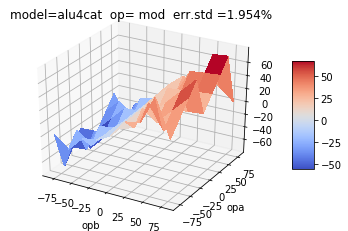

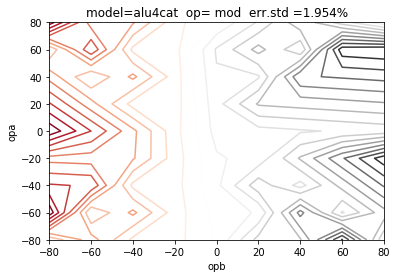

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

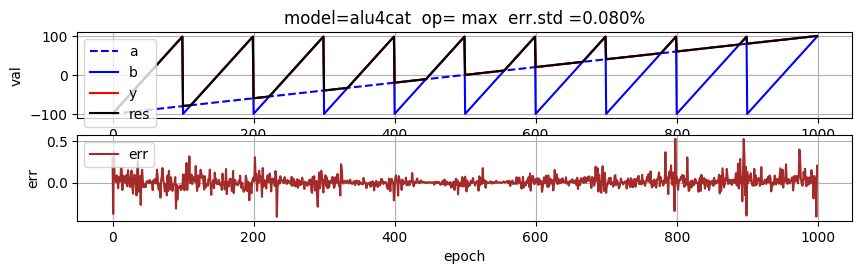

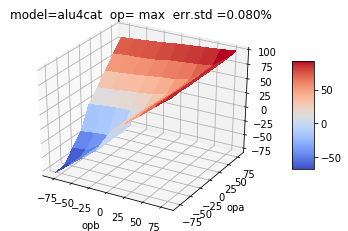

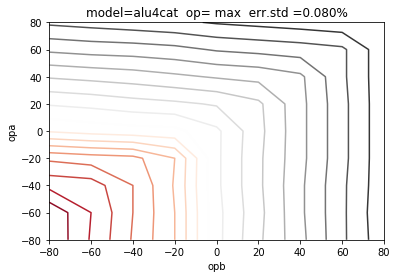

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

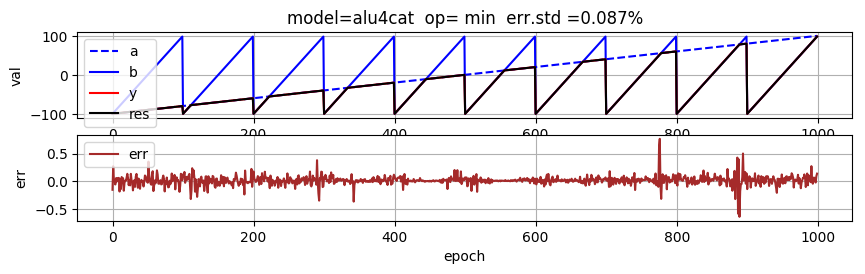

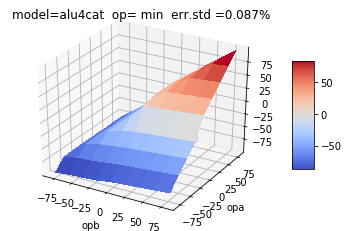

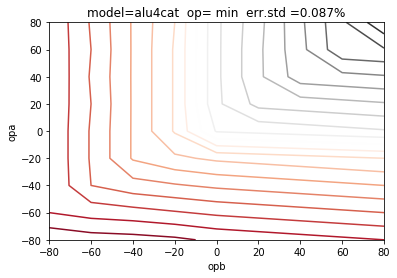

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

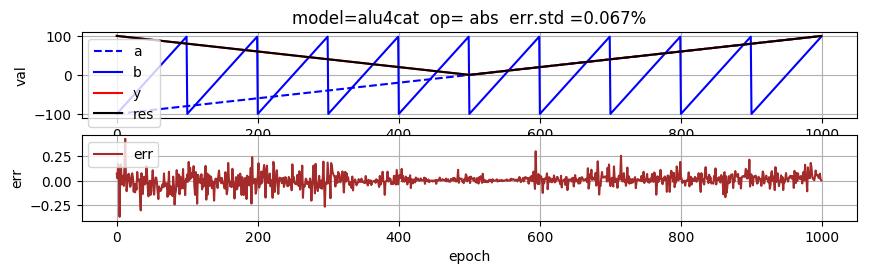

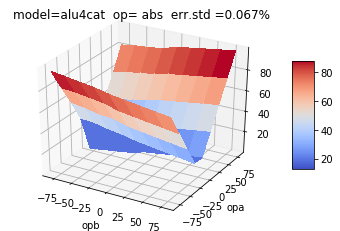

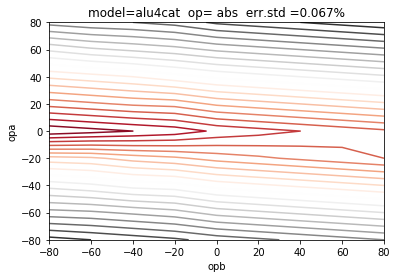

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

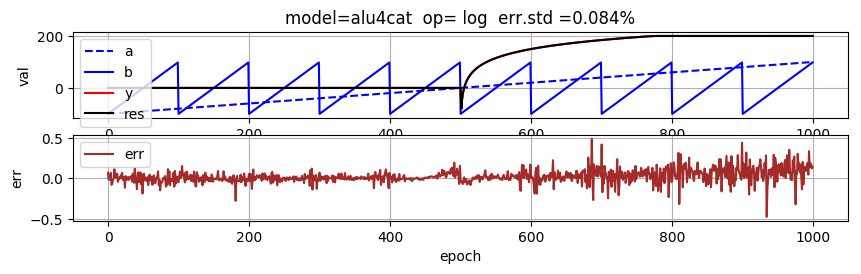

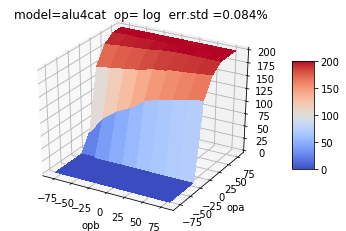

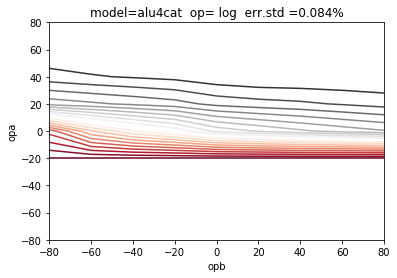

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

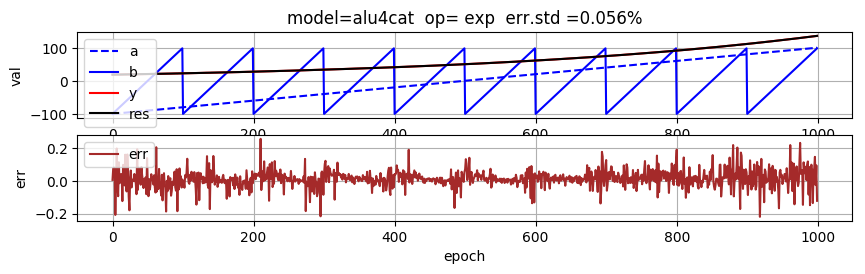

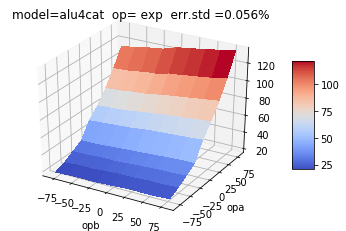

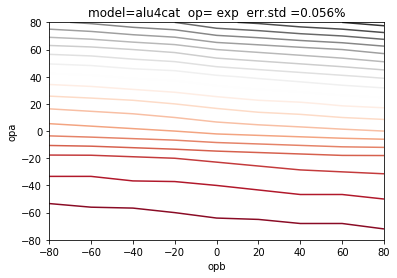

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

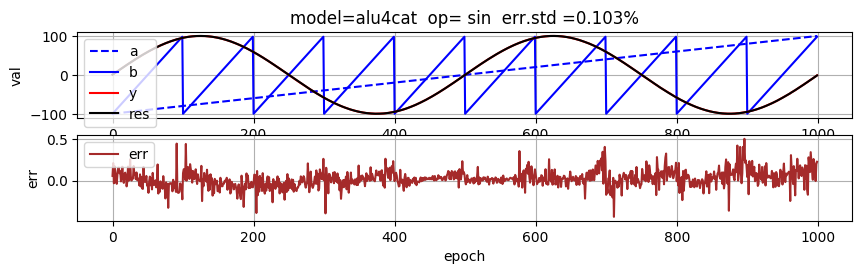

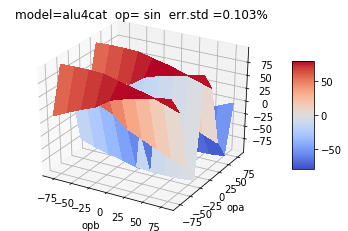

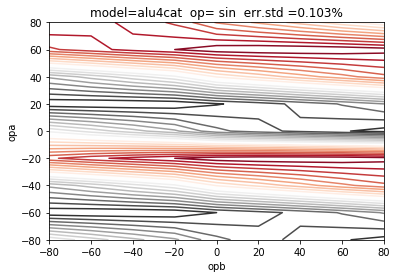

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

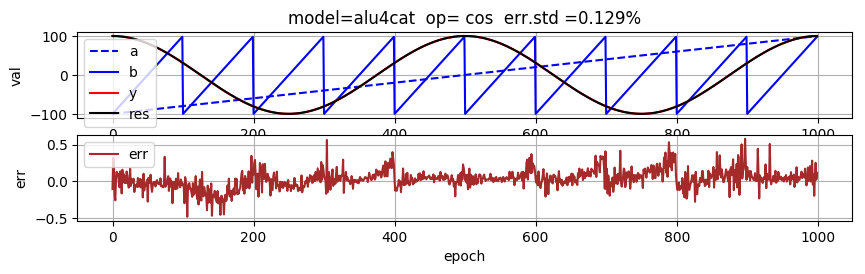

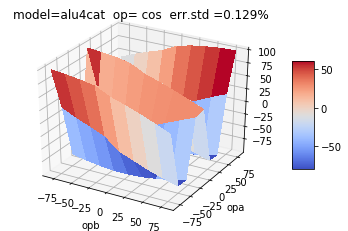

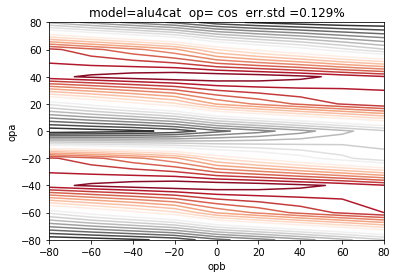

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

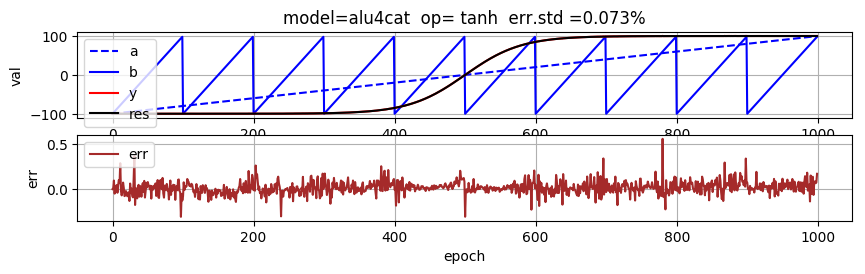

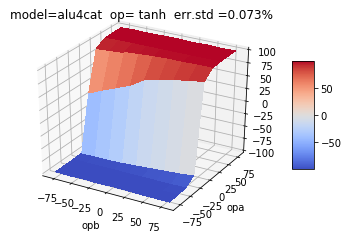

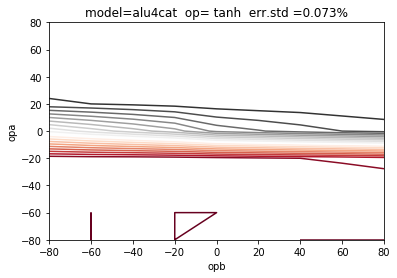

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

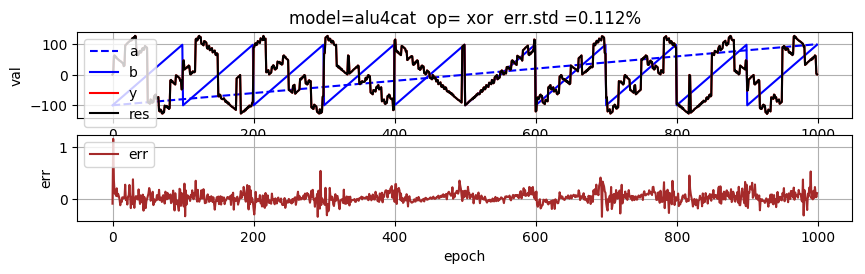

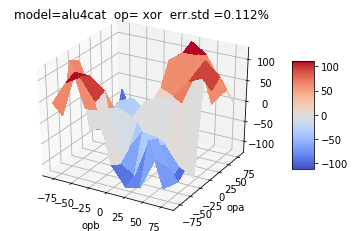

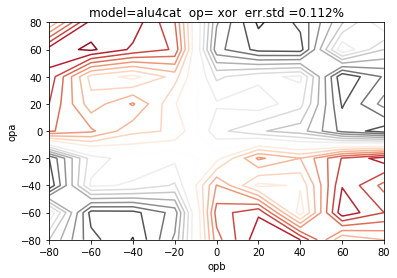

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

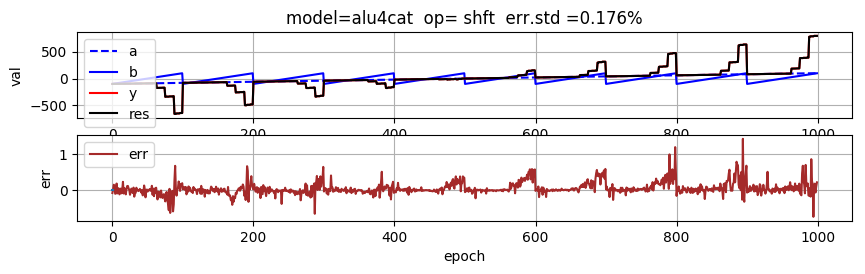

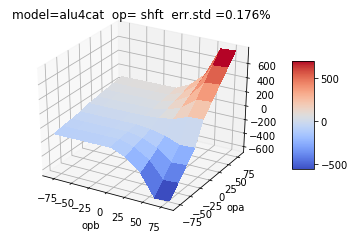

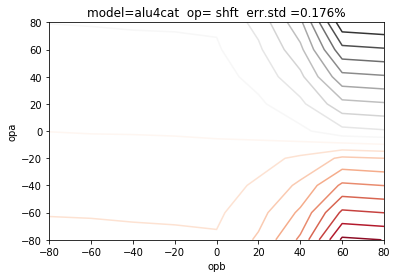

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

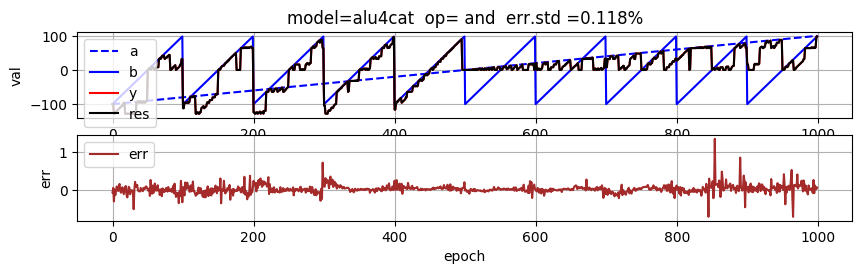

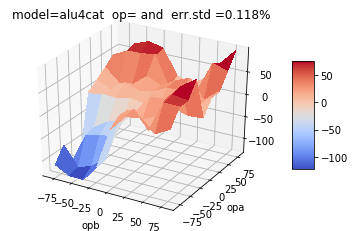

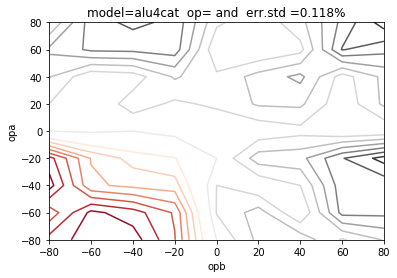

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

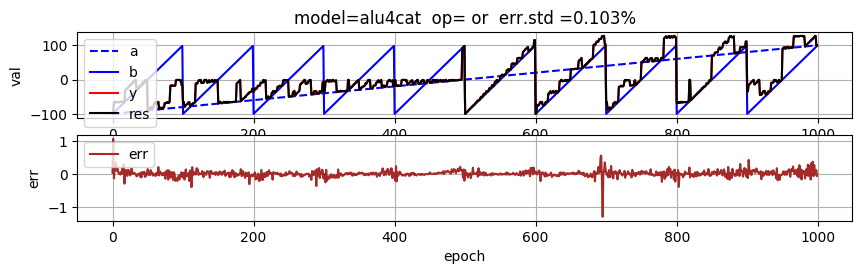

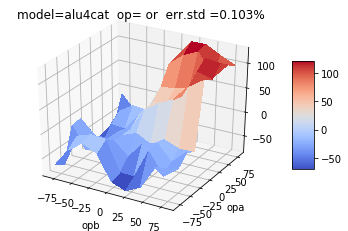

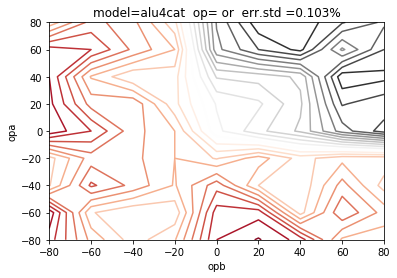

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

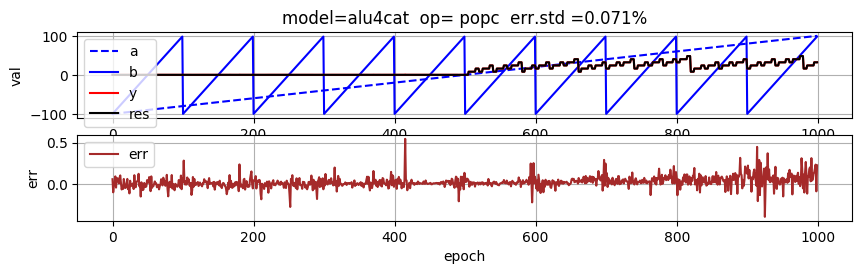

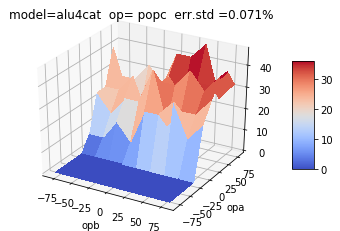

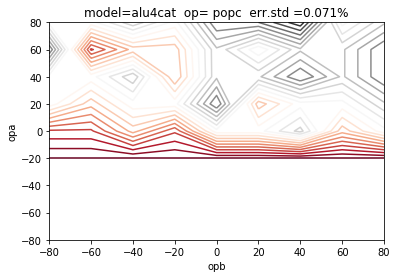

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

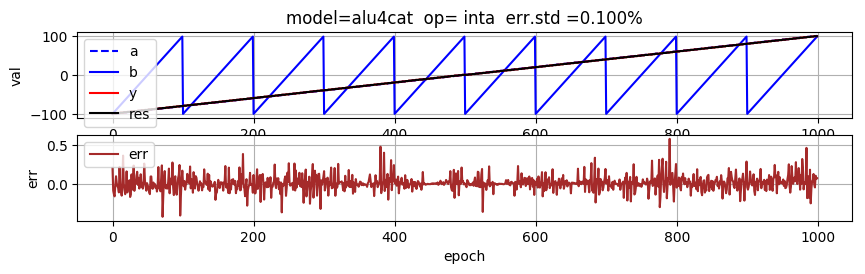

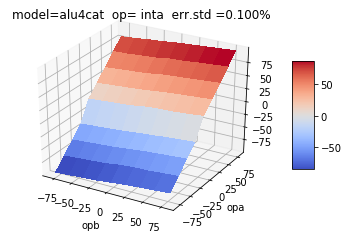

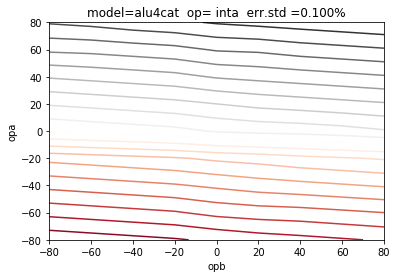

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

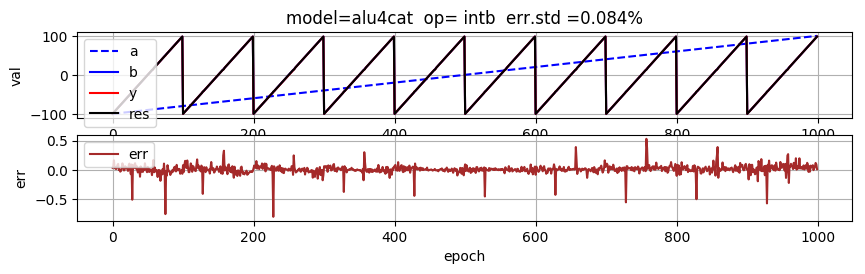

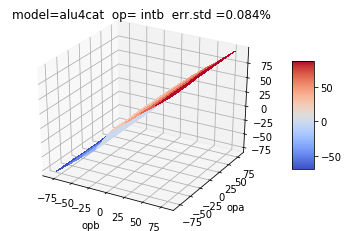

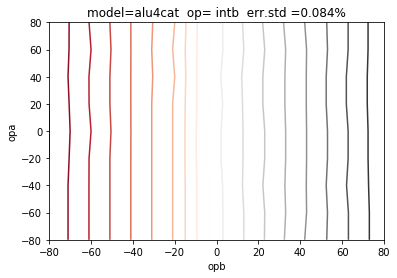

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

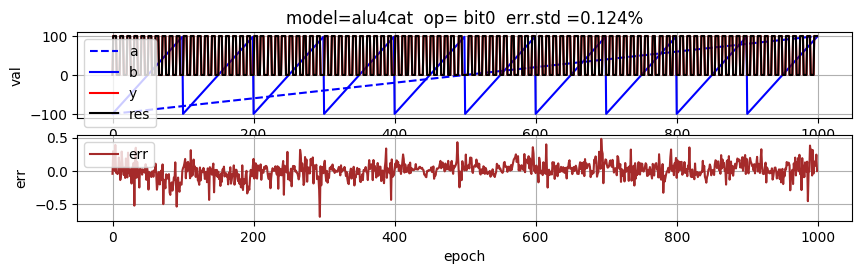

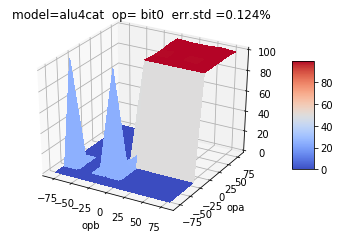

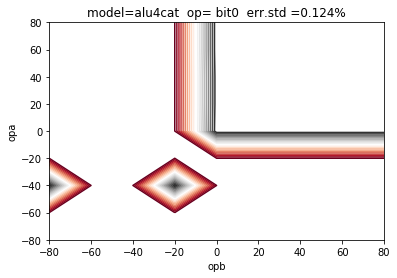

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

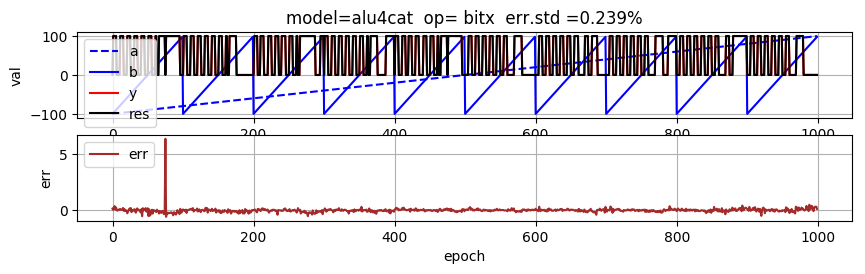

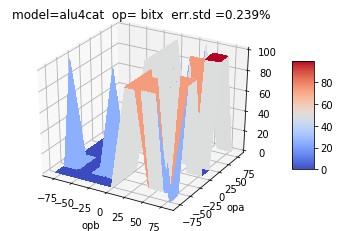

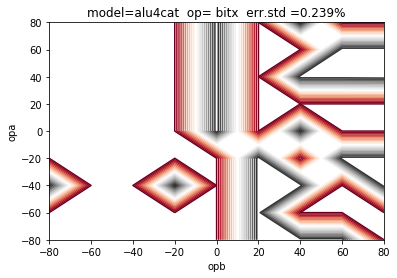

<IPython.core.display.Javascript object>

In [30]:


from matplotlib import pylab
from google.colab import widgets
tb = widgets.TabBar([str(opcodes[p]) for p in range(26)])

#for i in range(26):
#  # Only select the first 3 tabs, and render others in the background.
#  with tb.output_to(i, select=(i < 3)):
#    pylab.plot([1, i, 3])
#    pylab.show()


#yo = alumodel.predict( [xx0,xx0], verbose=1)
#yo = alu0_model.predict( [xx0,xx0], verbose=1)

if(model=='alu0') : yo = alu0_model.predict( xx0, verbose=1)
if(model=='alu1') : yo = alu1_model.predict( xx0, verbose=1)
if(model=='alu2') : yo = alu2_model.predict( xx0, verbose=1)
if(model=='alu3') : yo = alu3_model.predict( xx0, verbose=1)
if(model=='alu4') : yo = alu4_model.predict( xx0, verbose=1)



err=yo-y

for p in range(0,26) :
 
  i=p*1000
  #print(i)
  std=np.std(err[i:i+1000])
  #print(std)
  
  dpi = 200
  xinch = 2000 / dpi
  yinch =  500 / dpi
  
  
  with tb.output_to(p,select=p<3) :

    # plot and save in the same size as the original
    fig = plt.figure(figsize=(xinch,yinch),dpi=100)
    
    plt.subplot(2, 1, 1)
  
    plt.plot(x [i:i+1000,0,0],label="a",color='blue',linestyle='--')
    plt.plot(x [i:i+1000,0,1],label="b",color='blue',linestyle='-')
    plt.plot(yo[i:i+1000],    label="res",color='red')
    plt.plot(y [i:i+1000],    label="y",color='black')
   
  
    title= 'model=' + ymodel[eons] + inp + "  op="+' '+ op[i]+'  err.std ='+str('%3.3f%%'% std)
    
    plt.title(title)
    plt.ylabel('val')
    
    plt.legend(['a', 'b', 'y', 'res', 'err'], loc='upper left')
    plt.grid(True)
    
    plt.subplot(2, 1, 2)
    plt.ylabel('err')
    plt.xlabel('epoch')
    plt.grid(True)
    
    plt.plot(err[i:i+1000], label="err",color='brown')
    plt.plot([0,0], label="zero")
    plt.legend(['err'], loc='upper left')

   #pylab.show()

  #

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    
    # Make data.
    XX = np.arange(-100, 100, 20)
    YY = np.arange(-100, 100, 20)
    XX, YY = np.meshgrid(XX, YY)
    ZZ = 0*(XX**2 + YY**2)
    #ZZ = np.sin(RR)
   
    z=np.zeros((10,10))
    #z=ZZ
    
    #print('YY=', YY.shape, YY[0:10,0])
    #print('ZZ=', ZZ.shape, ZZ[0:10,0])
    #print('z=', z.shape, z[0:10,0])
    
     
    for  ii in range(i,i+1000) :
      vara=int(xx[ii,0]/20)
      varb=int(xx[ii,1]/20)
      varo=int(yo[ii])
      #printf('ii=%d vara=%d, varb=%d, varo=%d\n', ii, vara, varb, varo)
      
      #z[vara+10, varb+10]=varo
      ZZ[vara+5, varb+5]=varo
    #print(z[0:10,0:10])
    # Plot the surface.
    surf = ax.plot_surface(XX[1:10,1:10], YY[1:10,1:10], ZZ[1:10,1:10], cmap=cm.coolwarm,
                           linewidth=0, antialiased=False)
    plt.title(title)
    plt.ylabel('opa')
    plt.xlabel('opb')

    
    
    # Customize the z axis.
    #ax.set_zlim(-1.01, 1.01)
    #ax.zaxis.set_major_locator(LinearLocator(10))
    #ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    
    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    plt.show()  
    
    fig = plt.figure()
    #ontour = plt.contour(XX, YY, z, colors='black')
    #ontour = plt.contour(XX, YY, z, colors='RdGy')
    contour = plt.contour(XX[1:10,1:10], YY[1:10,1:10], ZZ[1:10,1:10], 20, cmap='RdGy');

    plt.title(title)
    plt.ylabel('opa')
    plt.xlabel('opb')




In [22]:
print(xcat0[1,:])


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


##Make a set of movies to show training history for each opcode

/content/movies
/content
Creation of the directory path
/content/movies
alu0_model.png	ALU_op_bit0.mp4  ALU_op_log.mp4   ALU_op_selb.mp4
alu1_model.png	ALU_op_bitx.mp4  ALU_op_max.mp4   ALU_op_shft.mp4
alu2_model.png	ALU_op_cos.mp4	 ALU_op_min.mp4   ALU_op_sign.mp4
alu3_model.png	ALU_op_cst0.mp4  ALU_op_mod.mp4   ALU_op_sin.mp4
alu4_model.png	ALU_op_div.mp4	 ALU_op_mult.mp4  ALU_op_sub.mp4
ALU_op_abs.mp4	ALU_op_exp.mp4	 ALU_op_or.mp4	  ALU_op_tanh.mp4
ALU_op_add.mp4	ALU_op_inta.mp4  ALU_op_popc.mp4  ALU_op_xor.mp4
ALU_op_and.mp4	ALU_op_intb.mp4  ALU_op_sela.mp4  model.png
(1000, 26000)
(26000, 1) ...


/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "
/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "
/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationW

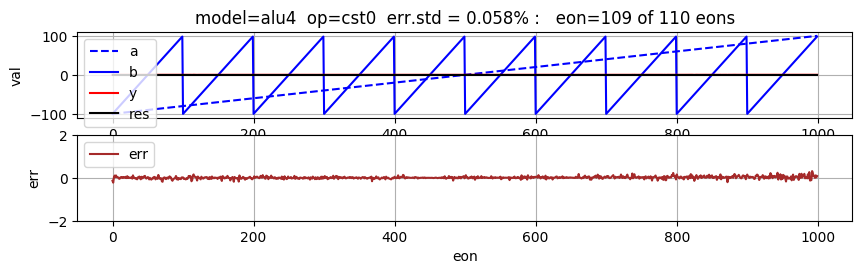

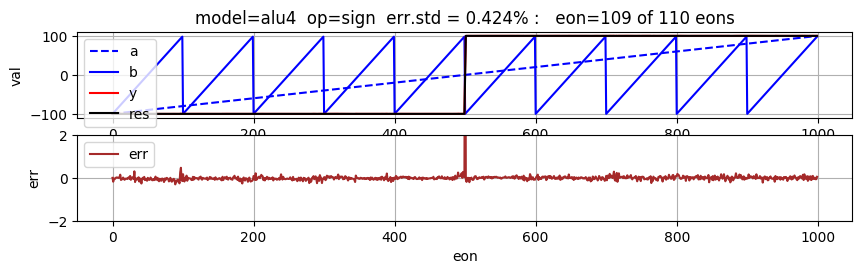

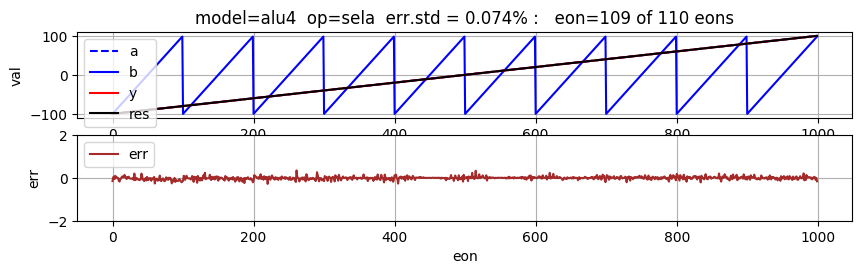

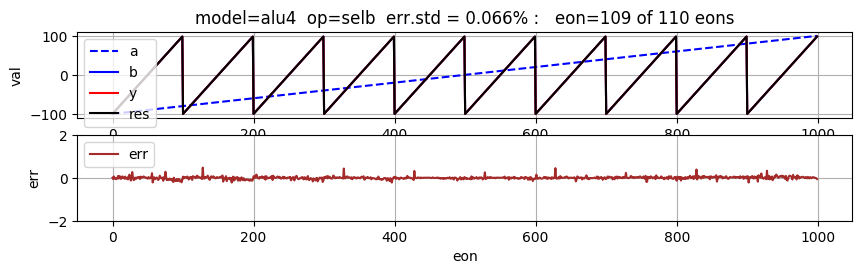

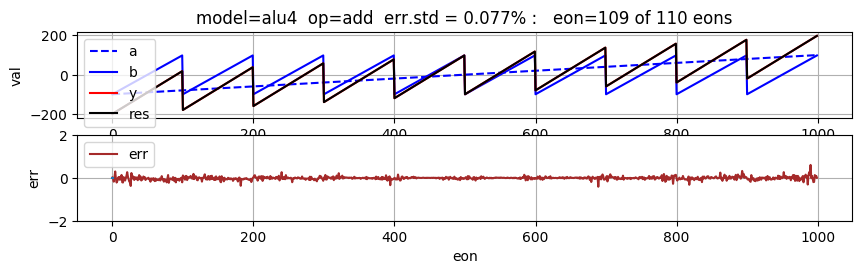

...

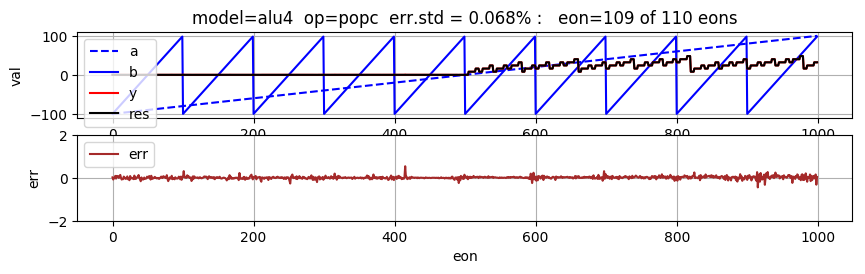

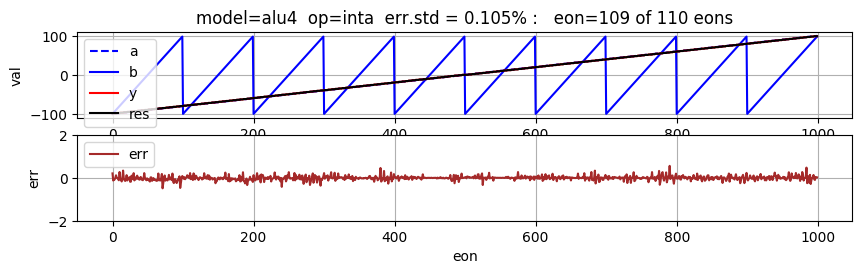

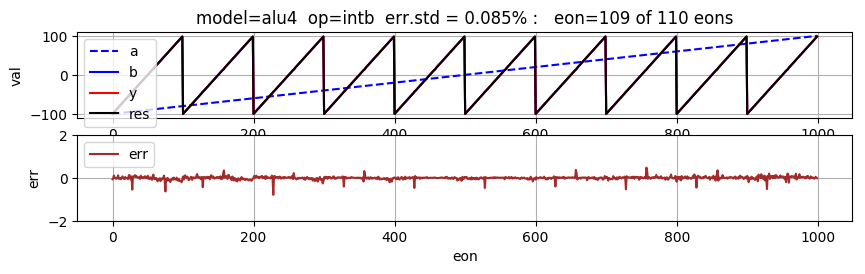

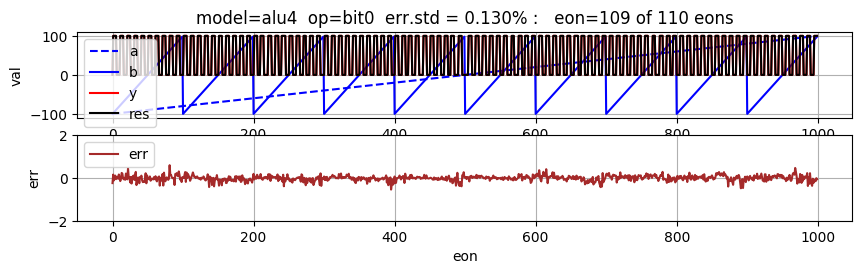

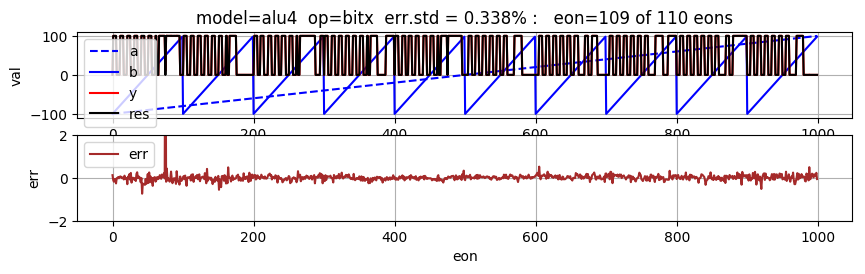

In [31]:
#make a movie 

import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.animation as manimation
from matplotlib.animation import FFMpegWriter
from matplotlib.animation import FFMpegFileWriter
from matplotlib.animation import ImageMagickWriter

import base64
from IPython.display import HTML


# Fixing random state for reproducibility
#np.random.seed(19680801)

#make the movie dir and delete any existing movies
import os

print(os.getcwd())
os.chdir('/content')
print(os.getcwd())
try:  
    os.mkdir("./movies")
except OSError:  
    print ("Creation of the directory %s"  % 'path')
else:  
    print ("Successfully created the directory %s " % 'path')
    
os.chdir('./movies')

print(os.getcwd())
!ls
!rm ./*.mp4

fps=eons/10
#fps=10

print(yhist.shape)

#FFMpegWriter = manimation.writers['ffmpeg']
#FFMpegWriter = manimation.writers['ImageMagickWriter']
#FFMpegWriter = manimation.writers['AVConvWriter']

metadata     = dict(title='Movie Test', artist='Matplotlib', comment='Movie support!')
writer       = FFMpegWriter(fps=fps, codec=None, bitrate=None, metadata=metadata)
#writer       = ImageMagickWriter(fps=1, codec=None, bitrate=None, metadata=metadata)

#ImageMagickWriter

dpi = 200.
xinch = 2000 / dpi
yinch =  500 / dpi

#fig = plt.figure(figsize=(xinch,yinch),dpi=100)



print(y.shape,ymodel[0])
#tb = widgets.TabBar([str(opcodes[p]) for p in range(26)])

for p in range (26) :
  
#  with tb.output_to(p,select=p<3) :
  if(1) :

    vtitle='ALU_op_' +  opcodes[p] + '.mp4'
    fig = plt.figure(figsize=(xinch,yinch),dpi=100)
  
    with writer.saving(fig, vtitle, dpi=100):
      #wite 40 frames
      for f in range(eons):
        i=p*1000
        
        #print('make frame p=%d frame=%d',p,f)
        yo=yhist[f, :]
        err=yo[:] - y[:,0]
        std=np.std(err[i:i+1000])
        title= 'model=' + ymodel[f] + '  op=' + op[i]+'  err.std = ' + str('%3.3f%% : '% std)+'  eon=' + str(f)+ ' of '  + str(eons) + ' eons'

        if f==0: 
          # plot 
          #fig = plt.figure(figsize=(xinch,yinch))
     
          plt.subplot(2, 1, 1)
    
          plt.plot(x  [ i:i+1000,0,0],label="a",color='blue',linestyle='--')
          plt.plot(x  [ i:i+1000,0,1],label="b",color='blue',linestyle='-')
          lo,=plt.plot(yo [ i:i+1000],    label="res",color='red')
          plt.plot(y  [ i:i+1000],    label="y",color='black')
          
             
          plt.title(title)
          plt.ylabel('val')
         
          plt.legend(['a', 'b', 'y', 'res', 'err'], loc='upper left')
          plt.grid(True)
      
          plt.subplot(2, 1, 2)
          plt.ylabel('err')
          plt.xlabel('eon')
          plt.grid(True)
          plt.ylim([-2,+2])
          
           
          le,=plt.plot(err[i:i+1000], label="err",color='brown')
          plt.plot([0,0], label="zero")
          plt.legend(['err'], loc='upper left')
     
        else :
          
          lo.set_data(range(1000),yo [ i:i+1000])
          le.set_data(range(1000),err[ i:i+1000])
          
          plt.subplot(2, 1, 1)
          plt.title(title)
          
        plt.show()
        writer.grab_frame()

    video = open('/content/movies/'+vtitle, 'r+b').read()
    
    encoded = base64.b64encode(video)
    HTML(data='''<video alt="test" controls>
                 <source src="data:video/mp4;base64,{0}" type="video/mp4" />
                 </video>'''.format(encoded.decode('ascii')))
    
  video = open('/content/movies/ALU_op_cst0.mp4', 'r+b').read()
  encoded = base64.b64encode(video)
  HTML(data='''<video alt="test" controls>
                  <source src="data:video/mp4;base64,{0}" type="video/mp4" />
               </video>'''.format(encoded.decode('ascii')))